In [1]:
import cv2
import matplotlib.pyplot as plt
import copy
import numpy as np
import json
import glob
import pandas as pd

import model
import util
from body import Body

d:\data_science\python\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
d:\data_science\python\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
d:\data_science\python\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


# Matching keypoints from model to UAV Human Dataset

In [2]:
# Index generated OpenPose model: Body Part name in UAV dataset

body_part_index = {0: 'nose',
#1: The model generates a neck but UAV doesn't have coordinates for neck
2: 'rightShoulder',
3: 'rightElbow',
4: 'rightWrist',
5: 'leftShoulder', 
6: 'leftElbow',
7: 'leftWrist',
8: 'rightHip',
9: 'rightKnee',
10: 'rightAnkle',
11: 'leftHip',
12: 'leftKnee',
13: 'leftAnkle',
14: 'rightEye',
15: 'leftEye',
16: 'rightEar',
17: 'leftEar'}

# Reverse the list to inverse reference
index_body_part = {v: k for k, v in body_part_index.items()}

# Defining Metric

In [3]:
def mAP(true_points, pred_points, thresh=5):
    
    # Initialize the precision and recall arrays
    precision = np.zeros(len(true_points))
    recall = np.zeros(len(true_points))
    
    pred_coords = []
    true_coords = []
    
    for key in true_points.keys():
        true_coords.append(true_points[key])
        pred_coords.append(pred_points[key])
    
    # Iterate over each body part
    for i in range(len(true_points)):
        # Calculate the Euclidean distance between the predicted and ground truth coordinates for the body part
        dist = np.linalg.norm(np.array(pred_coords[i]) - np.array(true_coords[i]))

        # Assign a label of 1 (true positive) or 0 (false positive) based on whether the distance is below or above the threshold
        label = int(dist <= thresh)

        # Update the precision and recall arrays
        if label == 1:
            precision[i] = 1
            recall[i] = 1
        else:
            precision[i] = 0
            recall[i] = 0

    # Calculate the cumulative precision and recall arrays
    cum_precision = np.cumsum(precision) / (np.arange(len(true_points)) + 1)
    cum_recall = np.cumsum(recall) / len(true_points)

    # Calculate the average precision
    ap = np.sum((cum_recall[1:] - cum_recall[:-1]) * cum_precision[1:])

    return ap

# Essential Functions

In [4]:
# Load pre-trained models
body_estimation = Body('body_pose_model.pth')

# Denormalizing function to match UAV Human Dataset coordinate format
def denorm(x, y, img):
    w, h, _ = img.shape
    d_x = (x/h)*100
    d_y = (y/w)*100
    
    return d_x, d_y

# Function to read JSON file
def read_json(json_file):
    # Dictionaries to hold body parts and its corresponding coordinates
    part_dict = {}
    corr_part_dict = {}
    
    # Opening JSON file
    f = open(json_file)

    # returns JSON object as 
    # a dictionary
    data = json.load(f)

    # Closing file
    f.close()
    
    # Extracts body parts from UAV Human file specific JSON file
    for part in data['completions'][0]['result']:
        if part['value']['keypointlabels'][0] in body_part_index.values():
            part_dict[part['value']['keypointlabels'][0]] = [part['value']['x'], part['value']['y']]
    
    # Checks if every body part is present in the file, else fills it with [0.0, 0.0]
    for body_part in body_part_index.values():
        if body_part in part_dict.keys():
            corr_part_dict[body_part] = part_dict[body_part]
        else:
            corr_part_dict[body_part] = [0.0, 0.0]

    return corr_part_dict
    

# Function to predict keypoints and draw it on an image
def predict_n_draw(image_path, labels, zero_ind):
    # Reading an image
    oriImg = cv2.imread(image_path)  # B,G,R order
    coords = {}
    
    # Generate Candidate and Subset
    # Candidate contains coordinates of the body parts along with the index and score
    # Subset contains information about different people in the image and which point belongs to which subject
    # along with the count and score
    candidate, subset = body_estimation(oriImg)
    
    # If in case, the model was not able to predict anything, and the candidate list is empty
    if np.shape(candidate)[0] == 0:
        canvas = copy.deepcopy(oriImg)
        plt.imshow(canvas[:, :, [2, 1, 0]])
        plt.axis('off')
        plt.show()
        return None, None

    # Denormalizing points to match the format of UAV Human Dataset
    x, y = denorm(candidate[:, 0], candidate[:, 1], oriImg)
    
    # If the true label of a body part is [0,0], i.e. it doesn't exist in the data
    for i in range(len(x)):
        if i in zero_ind:
            coords[body_part_index[i]] = [0.0, 0.0]
        elif i in labels:
            coords[body_part_index[i]] = [x[i], y[i]]
    
    # Draw the image and the points on it
    canvas = copy.deepcopy(oriImg)
    canvas = util.draw_bodypose(canvas, candidate, subset)
    
    plt.imshow(canvas[:, :, [2, 1, 0]])
    plt.axis('off')
    plt.show()
    return coords, subset


# Read Train Files

In [5]:
# Read from train txt
with open(r'..\\train_files.txt', 'r') as f:
    train_files = f.readlines()
f.close()

train_files = [i[:-1] for i in train_files]

# Generate body Keypoints

Class name: A000
Image Name: P086S00G10B00H00UC072000LC021000A000R0_09191527_125.jpg
mAP: 0.9411764705882353 0
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P022S00G10B50H50UC072000LC021000A000R0_08261755_005.jpg
mAP: 0.9411764705882353 1
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P114S00G20B00H00UC011000LC021000A000R0_10021051_100.jpg
mAP: 0.032439446366782004 2
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P029S00G21B00H00UC072001LC103001A000R0_08291427_242.jpg
mAP: 0.43305762864586395 3
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P086S11G10B00H00UC071000LC031000A000R0_09251344_145.jpg
mAP: 0.5371710181398763 4
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name

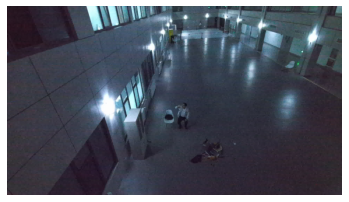

mAP: Undefined 16
------------------------------
Class name: A000
Image Name: P008S01G21B00H00UC072001LC031001A000R0_08311459_045.jpg
mAP: 0.8025753418054455 17
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P025S01G21B00H00UC082001LC031001A000R0_08291705_042.jpg
mAP: 0.9411764705882353 18
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P018S01G10B00H00UC006000LC022000A000R0_09111438_060.jpg
mAP: 0.6113754325259516 19
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P053S05G10B40H00UC061000LC021000A000R0_09061348_075.jpg
mAP: 0.9411764705882353 20
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P074S00G10B00H00UC071000LC021000A000R0_09151812_024.jpg
mAP: 0.9411764705882353 21
Number of true labels: 17
Number of pred labels: 17
-------

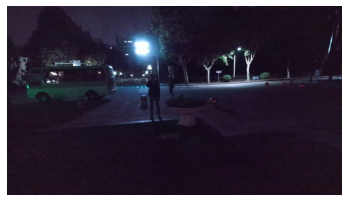

mAP: Undefined 27
------------------------------
Class name: A000
Image Name: P000S02G10B00H00UC021000LC021000A000R0_09301543_057.jpg
mAP: 0.8025753418054455 28
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P046S00G10B00H00UC072000LC022000A000R0_09011044_025.jpg
mAP: 0.9411764705882353 29
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P042S01G10B00H00UC022000LC021000A000R0_09031118_104.jpg
mAP: 0.010596885813148788 30
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P068S00G10B00H00UC031000LC031000A000R0_09131501_061.jpg
mAP: 0.8823529411764706 31
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P109S00G10B00H00UC072000LC022000A000R0_09271955_032.jpg


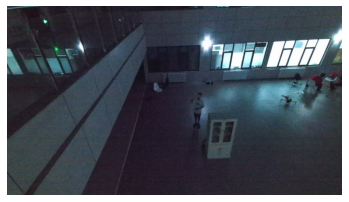

mAP: Undefined 32
------------------------------
Class name: A000
Image Name: P042S01G10B00H00UC022000LC021000A000R0_09031205_012.jpg
mAP: 0.9411764705882353 33
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P025S02G20B00H00UC043000LC043000A000R0_09011150_082.jpg
mAP: 0.0 34
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P020S00G20B50H40UC022000LC041000A000R0_08261615_088.jpg
mAP: 0.06332179930795848 35
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P113S23G10B00H00UC091000LC021000A000R0_10041547_090.jpg
mAP: 0.4161496951721866 36
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P021S00G10B50H50UC032000LC051000A000R0_08261651_096.jpg
mAP: 0.9411764705882353 37
Number of true labels: 17
Number of pred labels: 17
---------------------

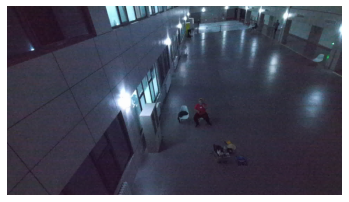

mAP: Undefined 60
------------------------------
Class name: A000
Image Name: P001S00G20B40H20UC072000LC021000A000R0_08241838_002.jpg
mAP: 0.9411764705882353 61
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P063S00G10B00H00UC072000LC021000A000R0_04601311_046.jpg
mAP: 0.0392156862745098 62
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P054S00G10B00H00UC052000LC062000A000R0_09061153_010.jpg
mAP: 0.31833910034602075 63
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P077S00G10B00H00UC042000LC032000A000R0_09161928_098.jpg
mAP: 0.8712946943483276 64
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P114S16G20B40H10UC061000LC021000A000R0_10031615_021.jpg
mAP: 0.9411764705882353 65
Number of true labels: 17
Number of pred labels: 17
------

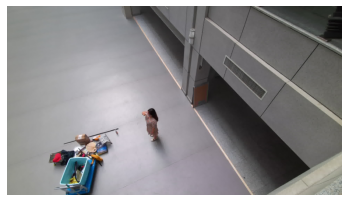

mAP: Undefined 67
------------------------------
Class name: A000
Image Name: P113S13G10B00H00UC051000LC051000A000R0_10021701_064.jpg
mAP: 0.8325473306009639 68
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P113S00G10B00H00UC021000LC021000A000R0_10020938_098.jpg
mAP: 0.030548690064261003 69
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P004S00G10B50H40UC092000LC022000A000R0_08251032_046.jpg
mAP: 0.9411764705882353 70
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P088S00G10B00H00UC062000LC031000A000R0_09201150_019.jpg
mAP: 0.6616493656286044 71
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P076S00G10B00H00UC012000LC021000A000R0_09161703_041.jpg
mAP: 0.8823529411764706 72
Number of true labels: 17
Number of pred labels: 17
-----

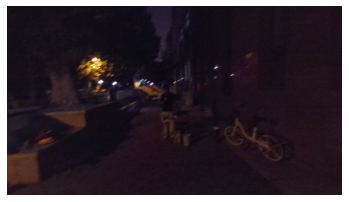

mAP: Undefined 74
------------------------------
Class name: A000
Image Name: P042S00G11B00H00UC072001LC022001A000R0_08311354_061.jpg
mAP: 0.9411764705882353 75
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P088S12G10B00H00UC072000LC031000A000R0_09241337_054.jpg
mAP: 0.9411764705882353 76
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P082S04G10B00H40UC082000LC021000A000R0_09181009_073.jpg
mAP: 0.6480747049951201 77
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P052S01G10B00H00UC022000LC022000A000R0_09060916_007.jpg
mAP: 0.9411764705882353 78
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P059S00G10B00H00UC072000LC021000A000R0_09091215_072.jpg
mAP: 0.8025753418054455 79
Number of true labels: 17
Number of pred labels: 17
-------

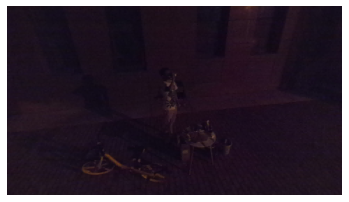

mAP: Undefined 98
------------------------------
Class name: A000
Image Name: P032S00G11B00H00UC102001LC072001A000R0_08301030_112.jpg


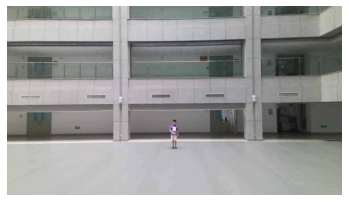

mAP: Undefined 99
------------------------------
Class name: A000
Image Name: P103S00G10B00H00UC022000LC091000A000R0_09251727_070.jpg
mAP: 0.9411764705882353 100
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P102S00G10B00H00UC021000LC031000A000R0_09251049_073.jpg
mAP: 0.34938734852229664 101
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P024S00G10B00H20UC062000LC062000A000R0_08271122_076.jpg
mAP: 0.8117296918767507 102
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P030S00G21B00H00UC033001LC033001A000R0_08291544_004.jpg
mAP: 0.8712946943483276 103
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P083S03G10B00H30UC012000LC021000A000R0_09181133_100.jpg
mAP: 0.9411764705882353 104
Number of true labels: 17
Number of pred labels: 17
-

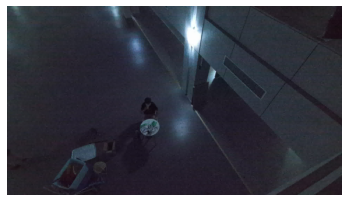

mAP: Undefined 110
------------------------------
Class name: A000
Image Name: P060S00G10B00H00UC082000LC052000A000R0_09081816_028.jpg
mAP: 0.8025753418054455 111
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P013S01G10B00H00UC022000LC031000A000R0_09051529_117.jpg
mAP: 0.06985294117647059 112
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P033S00G11B00H00UC022001LC062001A000R0_08301405_014.jpg
mAP: 0.9411764705882353 113
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P094S00G10B00H00UC072000LC031000A000R0_09211901_089.jpg


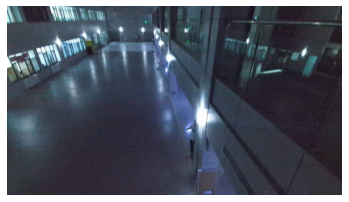

mAP: Undefined 114
------------------------------
Class name: A000
Image Name: P043S00G11B00H00UC022001LC022001A000R0_08311554_019.jpg
mAP: 0.9411764705882353 115
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P096S00G20B00H00UC022000LC031000A000R0_09221854_059.jpg


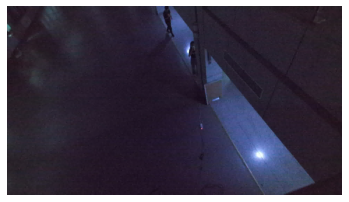

mAP: Undefined 116
------------------------------
Class name: A000
Image Name: P117S00G10B00H00UC021000LC021000A000R0_10031037_075.jpg
mAP: 0.9411764705882353 117
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P101S00G10B00H00UC072000LC021000A000R0_09242003_060.jpg


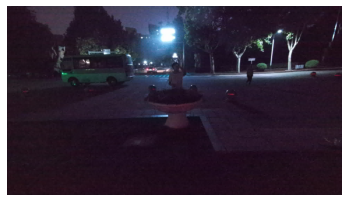

mAP: Undefined 118
------------------------------
Class name: A000
Image Name: P041S01G20B00H00UC082000LC021000A000R0_09031803_014.jpg
mAP: 0.18983769978579668 119
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P010S01G10B50H50UC072000LC091000A000R0_08261755_003.jpg
mAP: 0.018685121107266438 120
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P035S00G11B00H00UC072001LC022001A000R0_08301530_043.jpg
mAP: 0.733016771771097 121
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P050S01G10B00H20UC072000LC072000A000R0_09041517_055.jpg
mAP: 0.9411764705882353 122
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P016S00G10B50H20UC062000LC082000A000R0_08261307_065.jpg
mAP: 0.9411764705882353 123
Number of true labels: 17
Number of pred labels: 17

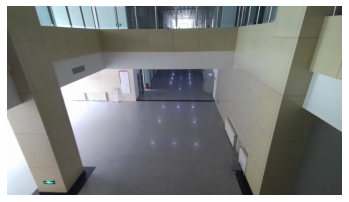

mAP: Undefined 127
------------------------------
Class name: A000
Image Name: P002S03G10B00H00UC062000LC092000A000R0_09071427_026.jpg
mAP: 0.9411764705882353 128
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P112S00G10B00H00UC051000LC061000A000R0_10011635_049.jpg
mAP: 0.01773356401384083 129
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P104S00G20B00H00UC011000LC031000A000R0_09252047_116.jpg


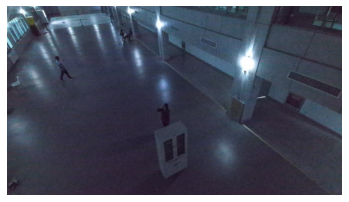

mAP: Undefined 130
------------------------------
Class name: A000
Image Name: P005S01G10B50H10UC022000LC022000A000R0_08251425_081.jpg
mAP: 0.9411764705882353 131
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P006S09G10B00H20UC031000LC022000A000R0_09282100_007.jpg
mAP: 0.9411764705882353 132
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P000S00G10B10H50UC022000LC021000A000R0_08251609_047.jpg
mAP: 0.9411764705882353 133
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P030S01G20B00H00UC072000LC033000A000R0_09061612_069.jpg
mAP: 0.8025753418054455 134
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A000
Image Name: P031S01G20B00H00UC022000LC022000A000R0_09111750_026.jpg
mAP: 0.7968880312305917 135
Number of true labels: 17
Number of pred labels: 17
-

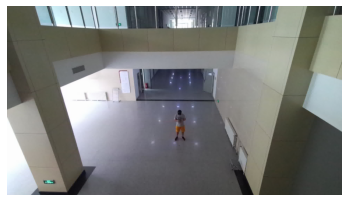

mAP: Undefined 139
------------------------------
Class name: A001
Image Name: P060S05G10B00H00UC011000LC031000A001R0_09231239_108.jpg
mAP: 0.9411764705882353 140
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P049S01G10B10H40UC062000LC022000A001R0_09041414_036.jpg
mAP: 0.9411764705882353 141
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P064S00G10B00H00UC022000LC021000A001R0_09101557_119.jpg
mAP: 0.9411764705882353 142
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P011S00G10B40H40UC022000LC022000A001R0_08251712_081.jpg
mAP: 0.9411764705882353 143
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P054S06G10B00H00UC052000LC021000A001R0_09071152_129.jpg
mAP: 0.8788927335640139 144
Number of true labels: 17
Number of pred labels: 17
-

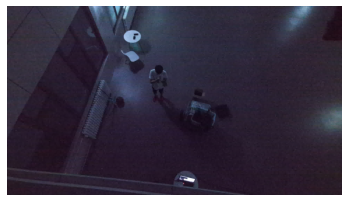

mAP: Undefined 156
------------------------------
Class name: A001
Image Name: P054S06G10B00H00UC052000LC062000A001R0_09061906_105.jpg


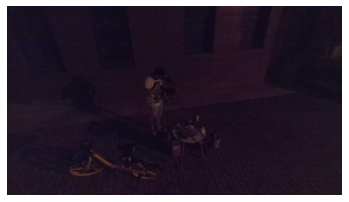

mAP: Undefined 157
------------------------------
Class name: A001
Image Name: P025S01G21B00H00UC082001LC031001A001R0_08291705_011.jpg
mAP: 0.9411764705882353 158
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P043S00G11B00H00UC022001LC022001A001R0_08311554_045.jpg
mAP: 0.9411764705882353 159
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P069S00G20B00H00UC053000LC053000A001R0_09131621_065.jpg
mAP: 0.03676470588235294 160
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P098S00G10B00H00UC051000LC021000A001R0_09231738_065.jpg
mAP: 0.9411764705882353 161
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P031S01G20B00H00UC022000LC022000A001R0_09111750_154.jpg
mAP: 0.3583065579172846 162
Number of true labels: 17
Number of pred labels: 17


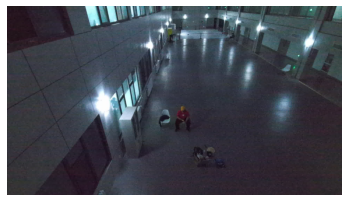

mAP: Undefined 163
------------------------------
Class name: A001
Image Name: P101S00G10B00H00UC072000LC021000A001R0_09242003_081.jpg


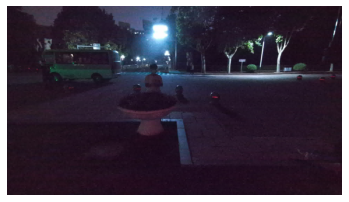

mAP: Undefined 164
------------------------------
Class name: A001
Image Name: P009S00G10B10H10UC032000LC032000A001R0_08251425_045.jpg
mAP: 0.9411764705882353 165
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P106S00G10B00H00UC021000LC021000A001R0_09261734_144.jpg
mAP: 0.7472120200061376 166
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P038S00G11B00H00UC072001LC061001A001R0_08310941_037.jpg
mAP: 0.9411764705882353 167
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P079S00G10B00H00UC022000LC021000A001R0_09086513_086.jpg
mAP: 0.9411764705882353 168
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P078S11G10B00H00UC012000LC022000A001R0_09191137_114.jpg
mAP: 0.03960084033613445 169
Number of true labels: 17
Number of pred labels: 17


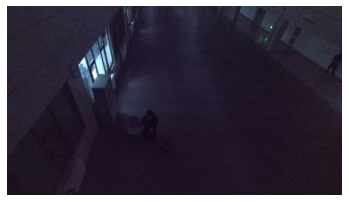

mAP: Undefined 171
------------------------------
Class name: A001
Image Name: P078S00G10B00H00UC072000LC031000A001R0_09171105_084.jpg
mAP: 0.027836134453781514 172
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P054S00G10B00H00UC052000LC062000A001R0_09061153_004.jpg
mAP: 0.9411764705882353 173
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P002S02G11B00H00UC062001LC032001A001R0_08310854_077.jpg
mAP: 0.9411764705882353 174
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P027S00G10B00H00UC022000LC092000A001R0_09031030_096.jpg
mAP: 0.9411764705882353 175
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P056S00G10B00H00UC062000LC021000A001R0_09070932_160.jpg
mAP: 0.9411764705882353 176
Number of true labels: 17
Number of pred labels: 17

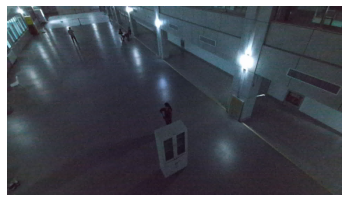

mAP: Undefined 191
------------------------------
Class name: A001
Image Name: P025S02G20B00H00UC043000LC043000A001R0_09011150_075.jpg
mAP: 0.0 192
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P035S00G11B00H00UC072001LC022001A001R0_08301530_084.jpg
mAP: 0.9411764705882353 193
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P047S01G10B00H00UC022000LC021000A001R0_09041056_114.jpg
mAP: 0.9411764705882353 194
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P088S12G10B00H00UC072000LC031000A001R0_09241337_082.jpg
mAP: 0.9411764705882353 195
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P091S00G10B00H00UC022000LC021000A001R0_09201811_214.jpg
mAP: 0.724974535268653 196
Number of true labels: 17
Number of pred labels: 17
-----------------

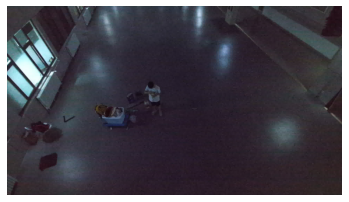

mAP: Undefined 198
------------------------------
Class name: A001
Image Name: P004S01G10B00H00UC062000LC021000A001R0_09280948_091.jpg
mAP: 0.9411764705882353 199
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P061S00G10B00H00UC092000LC021000A001R0_09091532_088.jpg
mAP: 0.9411764705882353 200
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P032S00G11B00H00UC102001LC072001A001R0_08301030_068.jpg


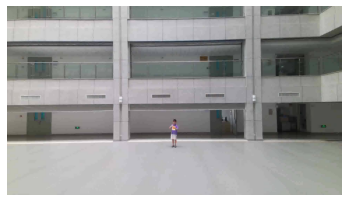

mAP: Undefined 201
------------------------------
Class name: A001
Image Name: P057S00G10B00H00UC022000LC031000A001R0_09071704_077.jpg
mAP: 0.9411764705882353 202
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P025S00G20B00H00UC072000LC031000A001R0_08271446_081.jpg
mAP: 0.9411764705882353 203
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P050S00G10B00H00UC072000LC042000A001R0_09031549_043.jpg
mAP: 0.11764705882352941 204
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P094S00G10B00H00UC072000LC031000A001R0_09211901_129.jpg


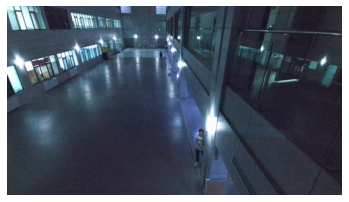

mAP: Undefined 205
------------------------------
Class name: A001
Image Name: P093S00G10B00H00UC082000LC112000A001R0_09211052_027.jpg
mAP: 0.15502406090641385 206
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P050S01G10B00H20UC072000LC072000A001R0_09041517_097.jpg
mAP: 0.9411764705882353 207
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P055S06G10B00H00UC022000LC021000A001R0_09071549_006.jpg
mAP: 0.9411764705882353 208
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P082S04G10B00H40UC082000LC021000A001R0_09181009_006.jpg
mAP: 0.6616493656286044 209
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P045S00G10B00H00UC072000LC022000A001R0_09010835_024.jpg
mAP: 0.9411764705882353 210
Number of true labels: 17
Number of pred labels: 17


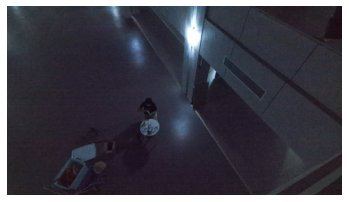

mAP: Undefined 229
------------------------------
Class name: A001
Image Name: P029S01G20B00H00UC042000LC031000A001R0_09041619_013.jpg
mAP: 0.9411764705882353 230
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P112S00G10B00H00UC051000LC061000A001R0_10011635_070.jpg
mAP: 0.05084033613445378 231
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P066S00G20B00H00UC112000LC031000A001R0_09111909_022.jpg


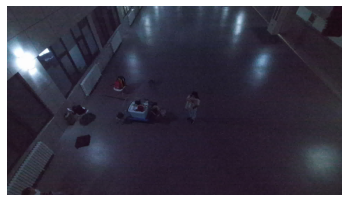

mAP: Undefined 232
------------------------------
Class name: A001
Image Name: P044S00G11B00H00UC032001LC062001A001R0_08311649_001.jpg
mAP: 0.9411764705882353 233
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P024S00G10B00H20UC062000LC062000A001R0_08271122_097.jpg
mAP: 0.6421923520539436 234
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P001S02G20B00H20UC112000LC031000A001R0_09051220_054.jpg
mAP: 0.6448426429395286 235
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P097S00G20B00H00UC072000LC031000A001R0_09222008_015.jpg


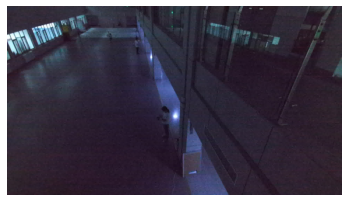

mAP: Undefined 236
------------------------------
Class name: A001
Image Name: P007S00G10B40H50UC022000LC052000A001R0_08251156_069.jpg
mAP: 0.9411764705882353 237
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P052S01G10B00H00UC022000LC022000A001R0_09060916_140.jpg
mAP: 0.9411764705882353 238
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P003S00G10B50H30UC012000LC021000A001R0_08251032_142.jpg
mAP: 0.9411764705882353 239
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P005S00G10B50H10UC022000LC022000A001R0_08251425_093.jpg
mAP: 0.9411764705882353 240
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P000S00G10B10H50UC022000LC021000A001R0_08251609_073.jpg
mAP: 0.05416666666666667 241
Number of true labels: 17
Number of pred labels: 17


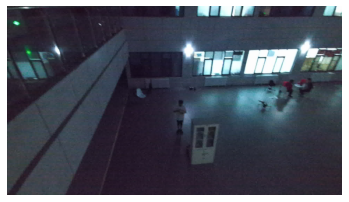

mAP: Undefined 267
------------------------------
Class name: A001
Image Name: P099S00G10B00H00UC031000LC031000A001R0_09231845_049.jpg
mAP: 0.21603641456582634 268
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P027S00G10B00H40UC022000LC062000A001R0_08271628_003.jpg
mAP: 0.47945501730103807 269
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P051S01G10B00H00UC072000LC021000A001R0_09041722_007.jpg
mAP: 0.029411764705882353 270
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P028S00G11B00H30UC032001LC030501A001R0_08291028_050.jpg
mAP: 0.9411764705882353 271
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A001
Image Name: P102S00G10B00H00UC021000LC031000A001R0_09251049_226.jpg
mAP: 0.4429065743944637 272
Number of true labels: 17
Number of pred labels: 

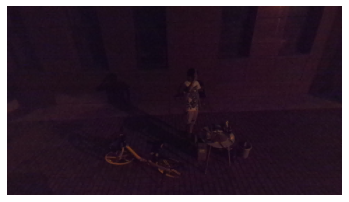

mAP: Undefined 296
------------------------------
Class name: A002
Image Name: P002S03G10B00H00UC062000LC092000A002R0_09071427_052.jpg
mAP: 0.9411764705882353 297
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P114S00G20B00H00UC011000LC021000A002R0_10021051_030.jpg
mAP: 0.03413865546218488 298
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P028S00G11B00H30UC032001LC031001A002R0_08291028_244.jpg
mAP: 0.1450321304992585 299
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P009S02G10B00H00UC011000LC032000A002R0_09271533_019.jpg
mAP: 0.9411764705882353 300
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P089S02G10B00H10UC072000LC022000A002R0_09201413_066.jpg
mAP: 0.9411764705882353 301
Number of true labels: 17
Number of pred labels: 17


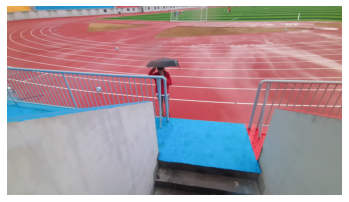

mAP: Undefined 305
------------------------------
Class name: A002
Image Name: P010S00G10B40H30UC072000LC061000A002R0_08251425_124.jpg
mAP: 0.8823529411764706 306
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P019S00G10B30H20UC022000LC022000A002R0_08261355_006.jpg
mAP: 0.9411764705882353 307
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P007S00G10B40H50UC022000LC052000A002R0_08251156_086.jpg
mAP: 0.8025753418054455 308
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P060S00G10B00H00UC082000LC052000A002R0_09081816_007.jpg
mAP: 0.07938704893722195 309
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P113S13G10B00H00UC051000LC051000A002R0_10021701_057.jpg
mAP: 0.9411764705882353 310
Number of true labels: 17
Number of pred labels: 17


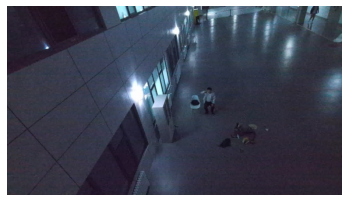

mAP: Undefined 340
------------------------------
Class name: A002
Image Name: P100S00G10B00H00UC072000LC031000A002R0_09241642_157.jpg
mAP: 0.8166089965397925 341
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P017S00G10B10H50UC022000LC062000A002R0_08261355_105.jpg
mAP: 0.5240641711229947 342
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P079S00G10B00H00UC022000LC021000A002R0_09171513_106.jpg
mAP: 0.8823529411764706 343
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P050S01G10B00H20UC072000LC072000A002R0_09041517_016.jpg
mAP: 0.9411764705882353 344
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P075S00G10B00H00UC092000LC022000A002R0_09151908_114.jpg
mAP: 0.9411764705882353 345
Number of true labels: 17
Number of pred labels: 17
-

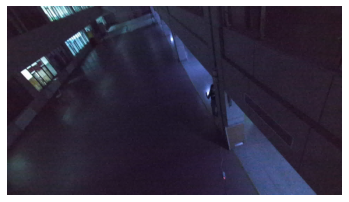

mAP: Undefined 372
------------------------------
Class name: A002
Image Name: P032S00G11B00H00UC102001LC072001A002R0_08301030_007.jpg


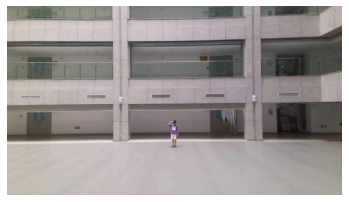

mAP: Undefined 373
------------------------------
Class name: A002
Image Name: P039S00G11B00H00UC022001LC022001A002R0_08311036_054.jpg
mAP: 0.4146791069368924 374
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P073S00G10B00H00UC022000LC021000A002R0_09151645_096.jpg
mAP: 0.9411764705882353 375
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P008S00G20B50H40UC041000LC031000A002R0_08251156_041.jpg
mAP: 0.9411764705882353 376
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P010S01G10B50H50UC072000LC091000A002R0_08261755_086.jpg
mAP: 0.011764705882352941 377
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P097S00G20B00H00UC072000LC031000A002R0_09222008_034.jpg


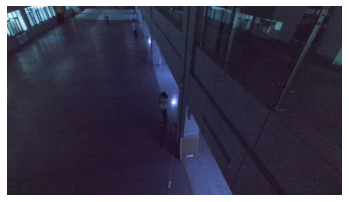

mAP: Undefined 378
------------------------------
Class name: A002
Image Name: P059S00G10B00H00UC072000LC021000A002R0_09091215_056.jpg
mAP: 0.5674740484429066 379
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P005S00G10B50H10UC022000LC022000A002R0_08251425_086.jpg
mAP: 0.9411764705882353 380
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P080S00G10B00H00UC071000LC021000A002R0_09171513_079.jpg
mAP: 0.28157439446366783 381
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P056S00G10B00H00UC062000LC021000A002R0_09070932_026.jpg
mAP: 0.9411764705882353 382
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P106S00G10B00H00UC021000LC021000A002R0_09261734_105.jpg
mAP: 0.9411764705882353 383
Number of true labels: 17
Number of pred labels: 17


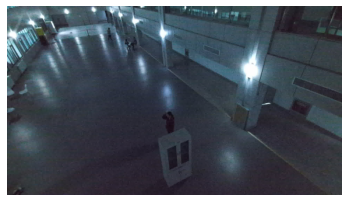

mAP: Undefined 394
------------------------------
Class name: A002
Image Name: P048S01G10B10H10UC072000LC022000A002R0_09041156_027.jpg
mAP: 0.8823529411764706 395
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P110S00G10B00H00UC021000LC021000A002R0_10011320_039.jpg
mAP: 0.9411764705882353 396
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P103S00G10B00H00UC022000LC091000A002R0_09251727_111.jpg
mAP: 0.1836007130124777 397
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P031S01G20B00H00UC022000LC022000A002R0_09111750_122.jpg
mAP: 0.9411764705882353 398
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P003S03G10B00H30UC012000LC021000A002R0_09292027_011.jpg


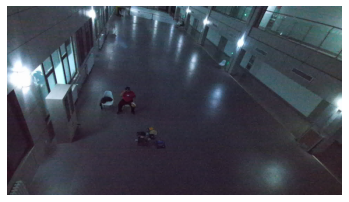

mAP: Undefined 399
------------------------------
Class name: A002
Image Name: P058S00G10B00H00UC022000LC071000A002R0_09071953_004.jpg


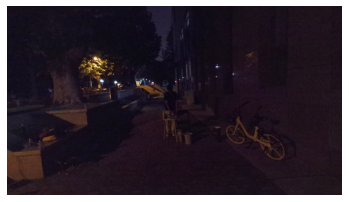

mAP: Undefined 400
------------------------------
Class name: A002
Image Name: P067S00G10B00H00UC072000LC022000A002R0_09112012_052.jpg
mAP: 0.26210306417918877 401
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P047S01G10B00H00UC022000LC021000A002R0_09041056_098.jpg
mAP: 0.5917675893886967 402
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P095S00G10B00H00UC072000LC021000A002R0_09212012_060.jpg


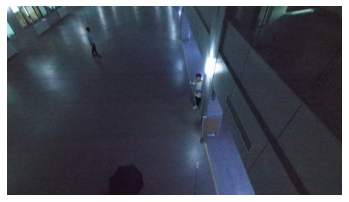

mAP: Undefined 403
------------------------------
Class name: A002
Image Name: P035S00G11B00H00UC071001LC021001A002R0_08301530_100.jpg
mAP: 0.8025753418054455 404
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P004S01G10B00H00UC062000LC021000A002R0_09280478_047.jpg
mAP: 0.8325473306009639 405
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P002S02G11B00H00UC062001LC032001A002R0_08310854_033.jpg
mAP: 0.9411764705882353 406
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P018S00G10B30H30UC022000LC022000A002R0_08261355_109.jpg
mAP: 0.8025753418054455 407
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A002
Image Name: P027S00G10B00H00UC022000LC092000A002R0_09031030_068.jpg
mAP: 0.9411764705882353 408
Number of true labels: 17
Number of pred labels: 17
-

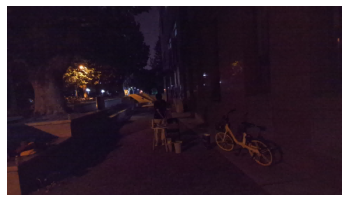

mAP: Undefined 416
------------------------------
Class name: A004
Image Name: P002S00G10B50H30UC062000LC092000A004R0_08250945_121.jpg
mAP: 0.9411764705882353 417
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P081S00G10B00H00UC072000LC021000A004R0_09180856_023.jpg
mAP: 0.11151642475171888 418
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P018S00G10B30H30UC022000LC022000A004R0_08261355_046.jpg
mAP: 0.019432773109243698 419
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P056S00G10B00H00UC062000LC021000A004R0_09070932_127.jpg
mAP: 0.9411764705882353 420
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P106S00G10B00H00UC021000LC021000A004R0_09261734_114.jpg
mAP: 0.14406108597285067 421
Number of true labels: 17
Number of pred labels: 

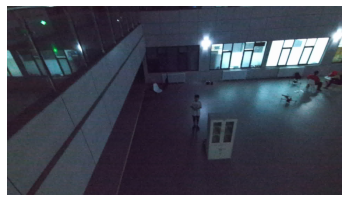

mAP: Undefined 423
------------------------------
Class name: A004
Image Name: P062S00G20B00H00UC102000LC021000A004R0_09100938_008.jpg


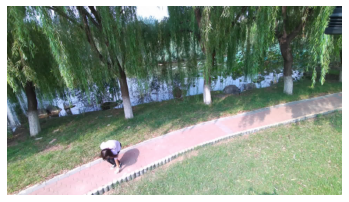

mAP: Undefined 424
------------------------------
Class name: A004
Image Name: P083S03G10B00H30UC012000LC021000A004R0_09181133_051.jpg
mAP: 0.9411764705882353 425
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P112S00G10B00H00UC051000LC061000A004R0_10011635_003.jpg
mAP: 0.03691506014170374 426
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P009S00G10B10H10UC032000LC032000A004R0_08251425_138.jpg
mAP: 0.9411764705882353 427
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P105S00G10B00H00UC031000LC021000A004R0_09261453_100.jpg
mAP: 0.9411764705882353 428
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P017S00G10B10H50UC022000LC062000A004R0_08261355_140.jpg
mAP: 0.6113754325259516 429
Number of true labels: 17
Number of pred labels: 17


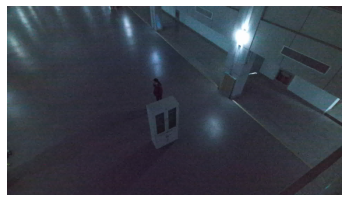

mAP: Undefined 439
------------------------------
Class name: A004
Image Name: P028S00G11B00H30UC032001LC031001A004R0_08291028_214.jpg
mAP: 0.9411764705882353 440
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P074S00G10B00H00UC071000LC021000A004R0_09151812_131.jpg
mAP: 0.9411764705882353 441
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P098S00G10B00H00UC051000LC021000A004R0_09231738_086.jpg
mAP: 0.9411764705882353 442
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P080S00G10B00H00UC071000LC021000A004R0_09171513_069.jpg
mAP: 0.9411764705882353 443
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P027S00G10B00H00UC022000LC092000A004R0_09031030_002.jpg
mAP: 0.42608866047447364 444
Number of true labels: 17
Number of pred labels: 17


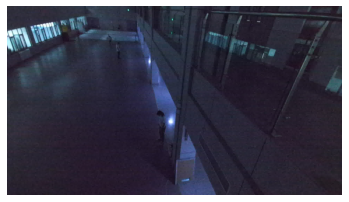

mAP: Undefined 447
------------------------------
Class name: A004
Image Name: P066S00G20B00H00UC112000LC031000A004R0_09111909_007.jpg


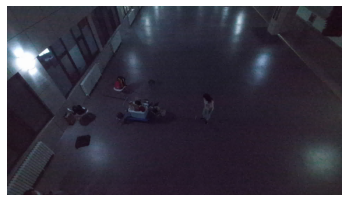

mAP: Undefined 448
------------------------------
Class name: A004
Image Name: P011S00G10B40H40UC022000LC022000A004R0_08251712_104.jpg
mAP: 0.9411764705882353 449
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P020S00G20B50H40UC022000LC041000A004R0_08261615_057.jpg
mAP: 0.1879201680672269 450
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P013S00G10B50H40UC032000LC021000A004R0_08260955_039.jpg


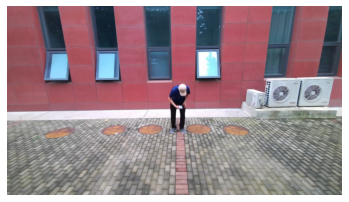

mAP: Undefined 451
------------------------------
Class name: A004
Image Name: P088S12G10B00H00UC072000LC031000A004R0_09241337_044.jpg


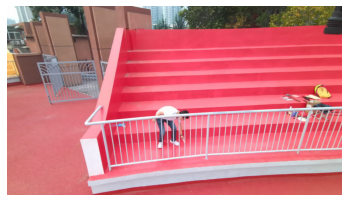

mAP: Undefined 452
------------------------------
Class name: A004
Image Name: P088S14G10B00H10UC072000LC031000A004R0_09241448_022.jpg
mAP: 0.18210370943934956 453
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P041S00G21B00H00UC053001LC053001A004R0_08311303_072.jpg
mAP: 0.8399002717774344 454
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P010S00G10B40H30UC072000LC061000A004R0_08251425_102.jpg
mAP: 0.9411764705882353 455
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P064S00G10B00H00UC022000LC021000A004R0_09101557_004.jpg
mAP: 0.7727298364841617 456
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P061S00G10B00H00UC092000LC021000A004R0_09091532_030.jpg
mAP: 0.8823529411764706 457
Number of true labels: 17
Number of pred labels: 17


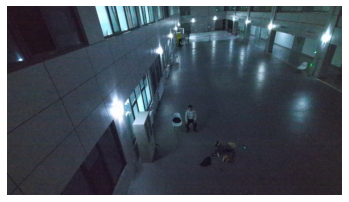

mAP: Undefined 459
------------------------------
Class name: A004
Image Name: P000S00G10B10H10UC022000LC021000A004R0_08241716_020.jpg
mAP: 0.3939457601222307 460
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P065S00G20B00H00UC022000LC091000A004R0_09111056_055.jpg
mAP: 0.7126774465442285 461
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P033S00G11B00H00UC022001LC062001A004R0_08301405_018.jpg


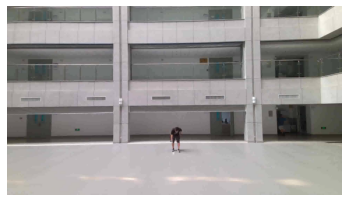

mAP: Undefined 462
------------------------------
Class name: A004
Image Name: P109S00G10B00H00UC072000LC022000A004R0_09271955_004.jpg


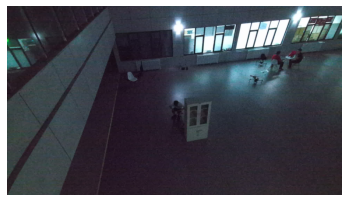

mAP: Undefined 463
------------------------------
Class name: A004
Image Name: P072S00G10B00H00UC072000LC022000A004R0_09142020_081.jpg


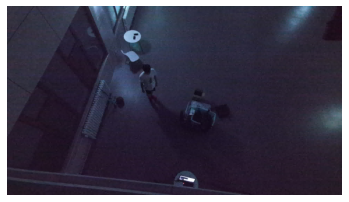

mAP: Undefined 464
------------------------------
Class name: A004
Image Name: P100S00G10B00H00UC072000LC031000A004R0_09241642_021.jpg


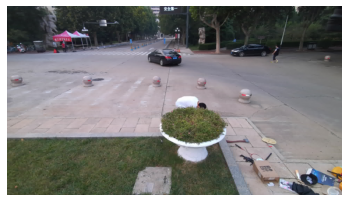

mAP: Undefined 465
------------------------------
Class name: A004
Image Name: P118S00G10B00H00UC051000LC021000A004R0_10031527_033.jpg
mAP: 0.9411764705882353 466
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P006S00G10B10H10UC072000LC022000A004R0_08251156_065.jpg


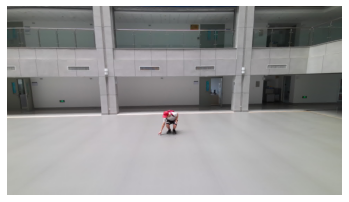

mAP: Undefined 467
------------------------------
Class name: A004
Image Name: P096S00G20B00H00UC022000LC031000A004R0_09221854_112.jpg


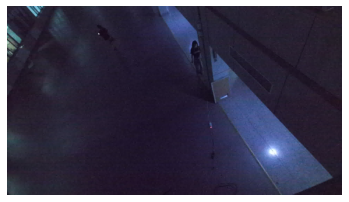

mAP: Undefined 468
------------------------------
Class name: A004
Image Name: P086S11G10B00H00UC071000LC031000A004R0_09251344_105.jpg
mAP: 0.9411764705882353 469
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P092S00G10B00H00UC072000LC061000A004R0_09210903_115.jpg
mAP: 0.9411764705882353 470
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P073S14G10B00H00UC032000LC021000A004R0_09191329_074.jpg
mAP: 0.9411764705882353 471
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P042S00G11B00H00UC072001LC022001A004R0_08311354_071.jpg
mAP: 0.9411764705882353 472
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P107S00G10B00H00UC021000LC031000A004R0_09262011_043.jpg
mAP: 0.09404555940023068 473
Number of true labels: 17
Number of pred labels: 17


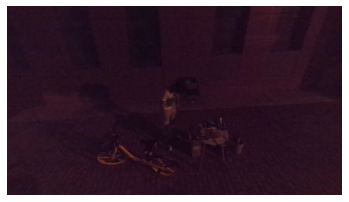

mAP: Undefined 477
------------------------------
Class name: A004
Image Name: P090S02G10B00H10UC032000LC021000A004R0_09201601_097.jpg
mAP: 0.9411764705882353 478
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P084S03G10B00H30UC072000LC021000A004R0_09181441_082.jpg
mAP: 0.6616493656286044 479
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P042S01G10B00H00UC022000LC021000A004R0_09031205_085.jpg
mAP: 0.9411764705882353 480
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P101S00G10B00H00UC072000LC021000A004R0_09242003_081.jpg
mAP: 0.8235294117647058 481
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P016S00G10B50H20UC062000LC082000A004R0_08261307_019.jpg


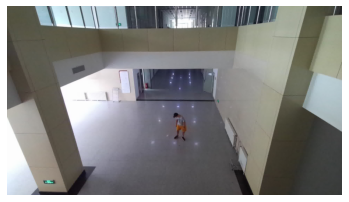

mAP: Undefined 482
------------------------------
Class name: A004
Image Name: P004S00G10B50H40UC092000LC022000A004R0_08251032_105.jpg
mAP: 0.9411764705882353 483
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P070S00G10B00H00UC102000LC092000A004R0_09131758_034.jpg


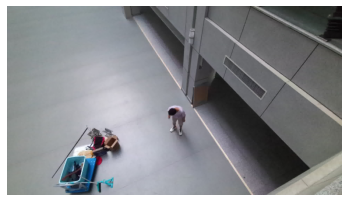

mAP: Undefined 484
------------------------------
Class name: A004
Image Name: P087S00G10B00H00UC072000LC021000A004R0_09201030_082.jpg
mAP: 0.9411764705882353 485
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P048S00G10B00H00UC072000LC022000A004R0_09031347_102.jpg
mAP: 0.01911764705882353 486
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P071S00G10B00H00UC022000LC092000A004R0_09131939_044.jpg


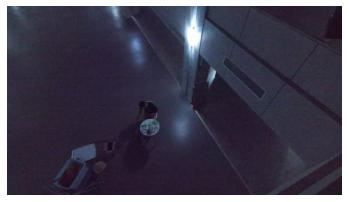

mAP: Undefined 487
------------------------------
Class name: A004
Image Name: P032S00G11B00H00UC102001LC072001A004R0_08301030_069.jpg


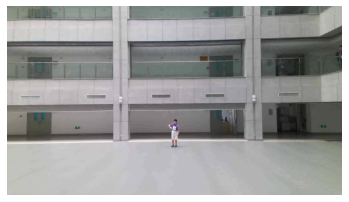

mAP: Undefined 488
------------------------------
Class name: A004
Image Name: P093S13G10B00H00UC072000LC032000A004R0_09251541_085.jpg
mAP: 0.8823529411764706 489
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P110S00G10B00H00UC021000LC021000A004R0_10011320_107.jpg
mAP: 0.9411764705882353 490
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P117S00G10B00H00UC021000LC021000A004R0_10031037_098.jpg
mAP: 0.9411764705882353 491
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P117S35G10B00H00UC061000LC031000A004R0_10041656_017.jpg
mAP: 0.38062283737024216 492
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P008S01G21B00H00UC072001LC031001A004R0_08311459_021.jpg
mAP: 0.012044817927170867 493
Number of true labels: 17
Number of pred labels: 1

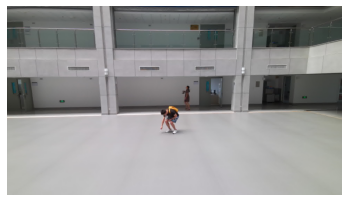

mAP: Undefined 495
------------------------------
Class name: A004
Image Name: P031S01G20B00H00UC022000LC022000A004R0_09111750_048.jpg


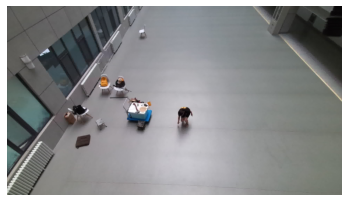

mAP: Undefined 496
------------------------------
Class name: A004
Image Name: P050S00G10B00H00UC071000LC041000A004R0_09031549_100.jpg
mAP: 0.9411764705882353 497
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P115S18G10B00H00UC041000LC021000A004R0_10021556_079.jpg
mAP: 0.5919730596201185 498
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P091S00G10B00H00UC022000LC021000A004R0_09201811_016.jpg
mAP: 0.5054957729698215 499
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P117S15G10B40H00UC051000LC021000A004R0_10031204_119.jpg
mAP: 0.6113754325259516 500
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P035S00G11B00H00UC072001LC022001A004R0_08301530_067.jpg
mAP: 0.9411764705882353 501
Number of true labels: 17
Number of pred labels: 17
-

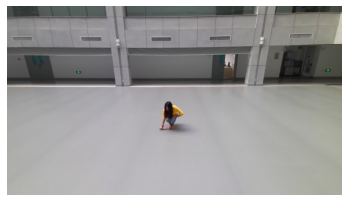

mAP: Undefined 508
------------------------------
Class name: A004
Image Name: P051S00G10B00H00UC072000LC062000A004R0_09040903_055.jpg
mAP: 0.02016806722689076 509
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P113S13G10B00H00UC051000LC051000A004R0_10021701_078.jpg


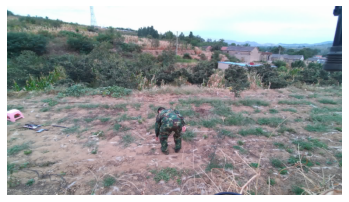

mAP: Undefined 510
------------------------------
Class name: A004
Image Name: P041S01G20B00H00UC082000LC021000A004R0_09031803_103.jpg
mAP: 0.18820028011204482 511
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P023S01G11B30H00UC062001LC091001A004R0_08300840_025.jpg


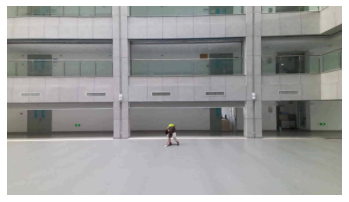

mAP: Undefined 512
------------------------------
Class name: A004
Image Name: P095S00G10B00H00UC072000LC021000A004R0_09212012_008.jpg


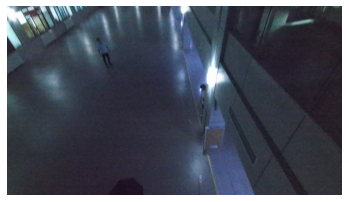

mAP: Undefined 513
------------------------------
Class name: A004
Image Name: P044S00G11B00H00UC032001LC062001A004R0_08311649_019.jpg
mAP: 0.11449579831932773 514
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P063S00G10B00H00UC072000LC021000A004R0_09101311_127.jpg
mAP: 0.06397058823529411 515
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P005S00G10B50H20UC022000LC022000A004R0_08251156_064.jpg
mAP: 0.9411764705882353 516
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P064S00G10B00H00UC022000LC021000A004R0_09101557_014.jpg


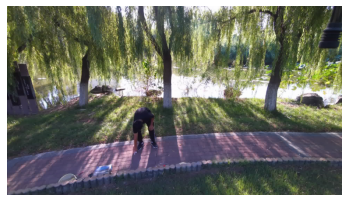

mAP: Undefined 517
------------------------------
Class name: A004
Image Name: P047S01G10B00H00UC022000LC021000A004R0_09041056_086.jpg
mAP: 0.9411764705882353 518
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P053S00G10B00H00UC072000LC021000A004R0_09061028_026.jpg


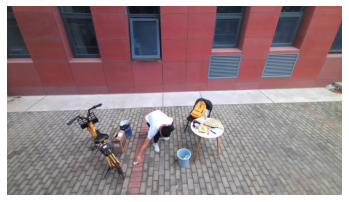

mAP: Undefined 519
------------------------------
Class name: A004
Image Name: P018S01G10B00H00UC012000LC022000A004R0_09111438_020.jpg
mAP: 0.046638655462184875 520
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P060S05G10B00H00UC011000LC031000A004R0_09231239_101.jpg


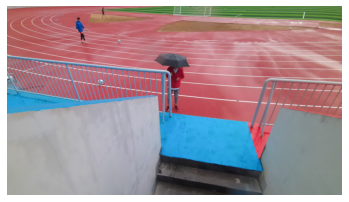

mAP: Undefined 521
------------------------------
Class name: A004
Image Name: P102S00G10B00H00UC021000LC031000A004R0_09251049_072.jpg
mAP: 0.9411764705882353 522
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P103S00G10B00H00UC022000LC091000A004R0_09251727_081.jpg
mAP: 0.9411764705882353 523
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P013S01G10B00H00UC022000LC031000A004R0_09051529_090.jpg
mAP: 0.8712946943483276 524
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P049S01G10B10H40UC062000LC022000A004R0_09041414_013.jpg
mAP: 0.8823529411764706 525
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P067S00G10B00H00UC072000LC022000A004R0_09112012_082.jpg


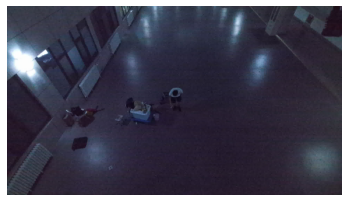

mAP: Undefined 526
------------------------------
Class name: A004
Image Name: P053S05G10B40H00UC061000LC021000A004R0_09061348_069.jpg
mAP: 0.9411764705882353 527
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P047S00G10B00H00UC072000LC021000A004R0_09030922_047.jpg
mAP: 0.9411764705882353 528
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P003S00G10B50H30UC012000LC021000A004R0_08251016_016.jpg
mAP: 0.9411764705882353 529
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P009S02G10B00H00UC042000LC062000A004R0_09011558_110.jpg
mAP: 0.9411764705882353 530
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P055S00G10B00H00UC072000LC021000A004R0_09061503_074.jpg
mAP: 0.633368822642179 531
Number of true labels: 17
Number of pred labels: 17
--

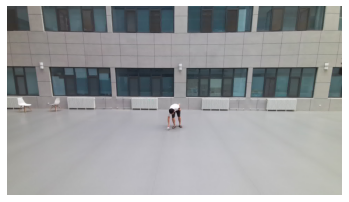

mAP: Undefined 536
------------------------------
Class name: A004
Image Name: P094S00G10B00H00UC072000LC031000A004R0_09211901_006.jpg


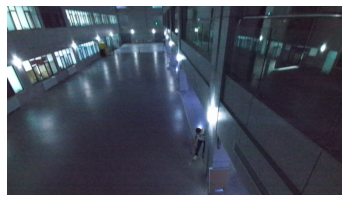

mAP: Undefined 537
------------------------------
Class name: A004
Image Name: P116S00G20B00H00UC111000LC021000A004R0_10021452_026.jpg
mAP: 0.0969187675070028 538
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P001S00G20B40H20UC072000LC021000A004R0_08241838_071.jpg
mAP: 0.9411764705882353 539
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P046S00G10B00H00UC072000LC022000A004R0_09011044_102.jpg
mAP: 0.8712946943483276 540
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P010S01G10B50H50UC072000LC091000A004R0_08261755_085.jpg
mAP: 0.9411764705882353 541
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A004
Image Name: P049S00G10B00H00UC062000LC022000A004R0_09031437_016.jpg
mAP: 0.9411764705882353 542
Number of true labels: 17
Number of pred labels: 17
-

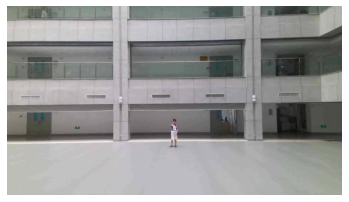

mAP: Undefined 564
------------------------------
Class name: A005
Image Name: P050S01G10B00H20UC072000LC072000A005R0_09041517_018.jpg
mAP: 0.9411764705882353 565
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P042S01G10B00H00UC022000LC021000A005R0_09031205_113.jpg
mAP: 0.10259515570934256 566
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P055S06G10B00H00UC022000LC021000A005R0_09071549_090.jpg
mAP: 0.9411764705882353 567
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P008S01G21B00H00UC072001LC031001A005R0_08311459_033.jpg
mAP: 0.9411764705882353 568
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P023S01G11B30H00UC062001LC091001A005R0_08300840_024.jpg
mAP: 0.6173414820473644 569
Number of true labels: 17
Number of pred labels: 17


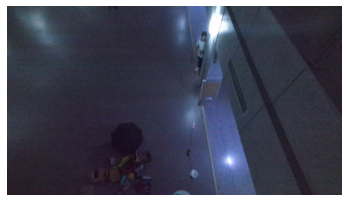

mAP: Undefined 575
------------------------------
Class name: A005
Image Name: P031S00G21B40H00UC023001LC023001A005R0_08291823_045.jpg
mAP: 0.9411764705882353 576
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P002S03G10B00H00UC062000LC092000A005R0_09071427_056.jpg
mAP: 0.9411764705882353 577
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P014S02G10B00H00UC051000LC021000A005R0_09292142_092.jpg


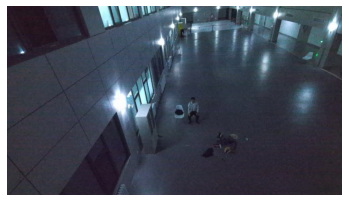

mAP: Undefined 578
------------------------------
Class name: A005
Image Name: P018S01G10B00H00UC012000LC022000A005R0_09111438_031.jpg
mAP: 0.9411764705882353 579
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P083S03G10B00H30UC012000LC021000A005R0_09181133_071.jpg
mAP: 0.8625681267982306 580
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P005S00G10B50H10UC022000LC022000A005R0_08251425_029.jpg
mAP: 0.9411764705882353 581
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P108S00G20B00H00UC111000LC073000A005R0_09271006_017.jpg
mAP: 0.7135785062688176 582
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P020S00G20B50H40UC022000LC041000A005R0_08261615_001.jpg
mAP: 0.9411764705882353 583
Number of true labels: 17
Number of pred labels: 17
-

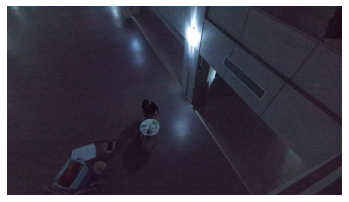

mAP: Undefined 596
------------------------------
Class name: A005
Image Name: P012S00G20B50H50UC072000LC100020A005R1_08251712_106.jpg
mAP: 0.5240641711229947 597
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P039S00G11B00H00UC022001LC022001A005R0_08311036_102.jpg
mAP: 0.9411764705882353 598
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P117S00G10B00H00UC021000LC021000A005R0_10031037_070.jpg
mAP: 0.9411764705882353 599
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P006S00G10B10H10UC072000LC022000A005R0_08251156_113.jpg
mAP: 0.9411764705882353 600
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P105S00G10B00H00UC032000LC022000A005R0_09261453_091.jpg
mAP: 0.004524886877828055 601
Number of true labels: 17
Number of pred labels: 17

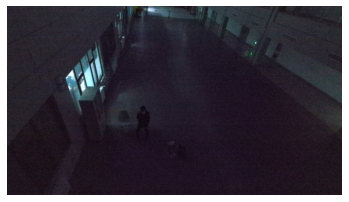

mAP: Undefined 621
------------------------------
Class name: A005
Image Name: P040S00G11B00H00UC061001LC061001A005R0_08311121_057.jpg
mAP: 0.2667661058664519 622
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P005S00G10B30H20UC022000LC022000A005R0_08260856_094.jpg
mAP: 0.5917675893886967 623
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P096S00G20B00H00UC022000LC031000A005R0_09221854_121.jpg


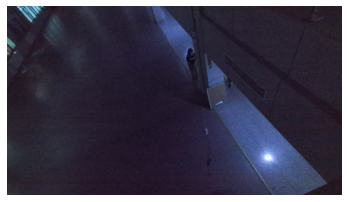

mAP: Undefined 624
------------------------------
Class name: A005
Image Name: P115S18G10B00H00UC041000LC021000A005R0_10021556_017.jpg
mAP: 0.37246152540270194 625
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P068S00G10B00H00UC031000LC031000A005R0_09131501_002.jpg
mAP: 0.9411764705882353 626
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P057S00G10B00H00UC022000LC031000A005R0_09071704_001.jpg
mAP: 0.9411764705882353 627
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P049S00G10B00H00UC062000LC022000A005R0_09031437_069.jpg
mAP: 0.08088235294117647 628
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P053S05G10B40H00UC061000LC021000A005R0_09061348_112.jpg
mAP: 0.09472318339100347 629
Number of true labels: 17
Number of pred labels: 1

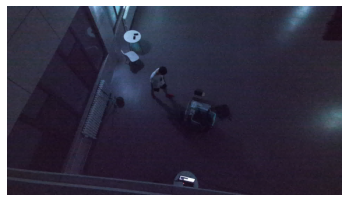

mAP: Undefined 638
------------------------------
Class name: A005
Image Name: P027S00G10B00H40UC022000LC062000A005R0_08271628_022.jpg
mAP: 0.9411764705882353 639
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P000S00G10B10H10UC022000LC021000A005R0_08241716_006.jpg
mAP: 0.9411764705882353 640
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P055S00G10B00H00UC072000LC021000A005R0_09061503_062.jpg
mAP: 0.4117647058823529 641
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P003S00G10B50H30UC012000LC021000A005R0_08251032_114.jpg
mAP: 0.9411764705882353 642
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P109S00G10B00H00UC072000LC022000A005R0_09271955_125.jpg


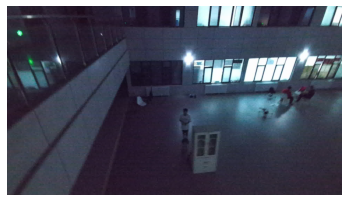

mAP: Undefined 643
------------------------------
Class name: A005
Image Name: P008S00G20B50H40UC041000LC031000A005R0_08251156_094.jpg
mAP: 0.7224813681128559 644
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P081S00G10B00H00UC072000LC021000A005R0_09180856_066.jpg
mAP: 0.11834209619676747 645
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P007S00G10B40H50UC022000LC052000A005R0_08251156_125.jpg
mAP: 0.9411764705882353 646
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P003S03G10B00H30UC012000LC021000A005R0_09292027_097.jpg


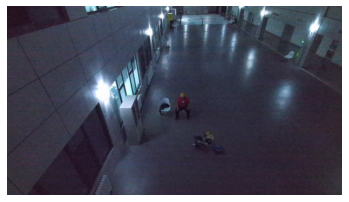

mAP: Undefined 647
------------------------------
Class name: A005
Image Name: P050S00G10B00H00UC072000LC042000A005R0_09031549_065.jpg
mAP: 0.9411764705882353 648
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P013S01G10B00H00UC022000LC031000A005R0_09051529_014.jpg
mAP: 0.9411764705882353 649
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P010S00G10B40H30UC072000LC061000A005R0_08251425_096.jpg
mAP: 0.9411764705882353 650
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P048S00G10B00H00UC072000LC022000A005R0_09031347_047.jpg
mAP: 0.9411764705882353 651
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P117S35G10B00H00UC061000LC031000A005R0_10041656_099.jpg
mAP: 0.9411764705882353 652
Number of true labels: 17
Number of pred labels: 17
-

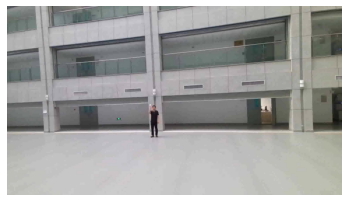

mAP: Undefined 668
------------------------------
Class name: A005
Image Name: P058S00G10B00H00UC022000LC071000A005R0_09071953_007.jpg


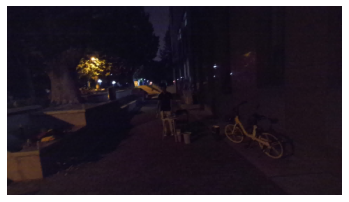

mAP: Undefined 669
------------------------------
Class name: A005
Image Name: P010S01G10B50H50UC072000LC091000A005R0_08261755_099.jpg
mAP: 0.9411764705882353 670
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P047S01G10B00H00UC022000LC021000A005R0_09041056_084.jpg
mAP: 0.9411764705882353 671
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P060S00G10B00H00UC082000LC052000A005R0_09081816_072.jpg
mAP: 0.9411764705882353 672
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P045S00G10B00H00UC072000LC022000A005R0_09005435_054.jpg
mAP: 0.9411764705882353 673
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A005
Image Name: P085S04G10B00H40UC072000LC021000A005R0_09181551_051.jpg
mAP: 0.8823529411764706 674
Number of true labels: 17
Number of pred labels: 17
-

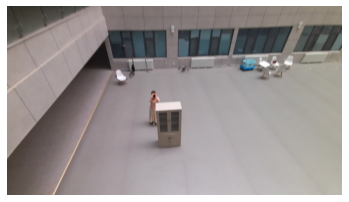

mAP: Undefined 708
------------------------------
Class name: A008
Image Name: P084S04G10B00H40UC072000LC021000A008R0_09181441_076.jpg
mAP: 0.4564508156203658 709
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P003S03G10B00H30UC012000LC021000A008R0_09292027_005.jpg
mAP: 0.01773356401384083 710
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P105S00G10B00H00UC032000LC022000A008R0_09261453_014.jpg
mAP: 0.242358708189158 711
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P027S00G10B00H00UC022000LC092000A008R0_09031030_041.jpg
mAP: 0.0634453781512605 712
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P003S00G10B50H30UC012000LC021000A008R0_08251032_073.jpg
mAP: 0.9411764705882353 713
Number of true labels: 17
Number of pred labels: 17
-

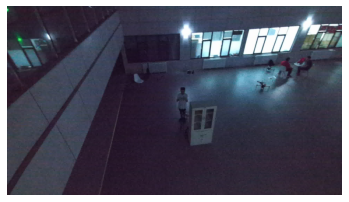

mAP: Undefined 719
------------------------------
Class name: A008
Image Name: P013S00G10B50H40UC032000LC021000A008R0_08260955_022.jpg
mAP: 0.9411764705882353 720
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P001S07G20B00H20UC102000LC031000A008R0_09061452_099.jpg
mAP: 0.3042572911517548 721
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P009S02G10B00H00UC042000LC062000A008R0_09011558_051.jpg
mAP: 0.9411764705882353 722
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P067S00G10B00H00UC072000LC022000A008R0_09112012_007.jpg
mAP: 0.16201053848112673 723
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P005S00G10B30H20UC022000LC022000A008R0_08260856_055.jpg
mAP: 0.9411764705882353 724
Number of true labels: 17
Number of pred labels: 17


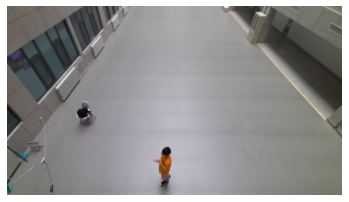

mAP: Undefined 732
------------------------------
Class name: A008
Image Name: P007S00G10B40H50UC022000LC052000A008R0_08251156_008.jpg
mAP: 0.9411764705882353 733
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P050S01G10B00H20UC072000LC072000A008R0_09041517_012.jpg
mAP: 0.9411764705882353 734
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P114S00G20B00H00UC011000LC021000A008R0_10021051_139.jpg
mAP: 0.20098039215686275 735
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P067S00G10B00H00UC072000LC022000A008R0_09112106_117.jpg
mAP: 0.9411764705882353 736
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P029S00G21B00H00UC072001LC103001A008R0_08291427_227.jpg
mAP: 0.8025753418054455 737
Number of true labels: 17
Number of pred labels: 17


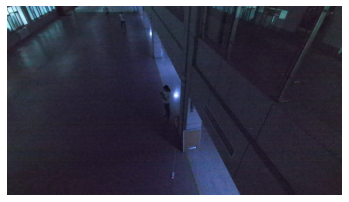

mAP: Undefined 738
------------------------------
Class name: A008
Image Name: P047S00G10B00H00UC072000LC021000A008R0_09030922_106.jpg
mAP: 0.9411764705882353 739
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P009S00G10B10H10UC032000LC032000A008R0_08251425_056.jpg
mAP: 0.9411764705882353 740
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P061S00G10B00H00UC092000LC021000A008R0_09091532_069.jpg
mAP: 0.8823529411764706 741
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P088S14G10B00H10UC072000LC031000A008R0_09241448_077.jpg
mAP: 0.6616493656286044 742
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P007S00G10B40H50UC022000LC052000A008R0_08251156_054.jpg
mAP: 0.9411764705882353 743
Number of true labels: 17
Number of pred labels: 17
-

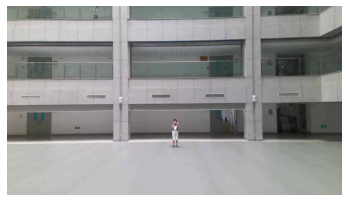

mAP: Undefined 766
------------------------------
Class name: A008
Image Name: P098S00G10B00H00UC051000LC021000A008R0_09231738_023.jpg
mAP: 0.9411764705882353 767
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P001S02G20B00H20UC112000LC031000A008R0_09051220_049.jpg
mAP: 0.22050378975119458 768
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P108S00G20B00H00UC111000LC073000A008R0_09271006_089.jpg


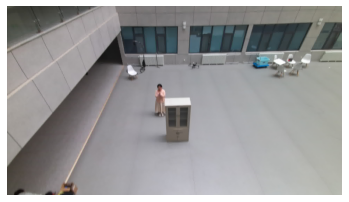

mAP: Undefined 769
------------------------------
Class name: A008
Image Name: P115S00G10B00H00UC061000LC021000A008R0_10021220_069.jpg
mAP: 0.6113754325259516 770
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P085S04G10B00H40UC072000LC021000A008R0_09181551_073.jpg
mAP: 0.9411764705882353 771
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P104S00G20B00H00UC011000LC031000A008R0_09252047_027.jpg
mAP: 0.04224305106658048 772
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P089S02G10B00H10UC072000LC022000A008R0_09201413_097.jpg
mAP: 0.9411764705882353 773
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P078S11G10B00H00UC012000LC022000A008R0_09191137_099.jpg
mAP: 0.02857142857142857 774
Number of true labels: 17
Number of pred labels: 17

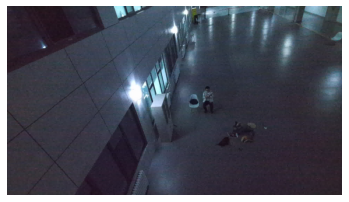

mAP: Undefined 802
------------------------------
Class name: A008
Image Name: P002S02G11B00H00UC062001LC032001A008R0_08310854_043.jpg
mAP: 0.9411764705882353 803
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P069S00G20B00H00UC053000LC053000A008R0_09131621_026.jpg
mAP: 0.6864495798319328 804
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P006S00G10B10H10UC072000LC022000A008R0_08251156_104.jpg
mAP: 0.9411764705882353 805
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P103S00G10B00H00UC022000LC091000A008R0_09251727_088.jpg
mAP: 0.9411764705882353 806
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P055S00G10B00H00UC072000LC021000A008R0_09061503_130.jpg
mAP: 0.6341474557737533 807
Number of true labels: 17
Number of pred labels: 17
-

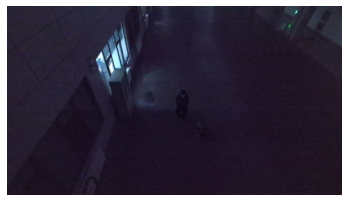

mAP: Undefined 810
------------------------------
Class name: A008
Image Name: P008S01G21B00H00UC072001LC031001A008R0_08311459_082.jpg
mAP: 0.9411764705882353 811
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P025S01G21B00H00UC082001LC031001A008R0_08291705_050.jpg
mAP: 0.9411764705882353 812
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P006S04G11B30H20UC072001LC022001A008R0_08311746_040.jpg
mAP: 0.9411764705882353 813
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P041S01G20B00H00UC082000LC021000A008R0_09031803_038.jpg
mAP: 0.9411764705882353 814
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A008
Image Name: P031S00G21B40H00UC023001LC023001A008R0_08291823_102.jpg
mAP: 0.9411764705882353 815
Number of true labels: 17
Number of pred labels: 17
-

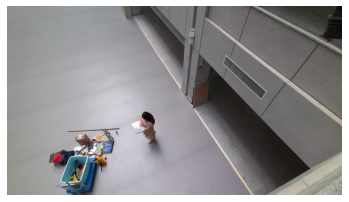

mAP: Undefined 835
------------------------------
Class name: A009
Image Name: P068S00G10B00H00UC031000LC031000A009R0_09131501_111.jpg
mAP: 0.2184873949579832 836
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P095S00G10B00H00UC036000LC021000A009R0_09212012_036.jpg


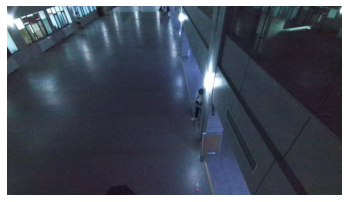

mAP: Undefined 837
------------------------------
Class name: A009
Image Name: P086S00G10B00H00UC072000LC021000A009R0_09191527_104.jpg
mAP: 0.9411764705882353 838
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P000S00G10B10H10UC022000LC021000A009R0_08241716_046.jpg
mAP: 0.9411764705882353 839
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P058S00G10B00H00UC022000LC071000A009R0_09071953_077.jpg
mAP: 0.11764705882352942 840
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P070S00G10B00H00UC102000LC092000A009R0_09131758_108.jpg
mAP: 0.41733515907391344 841
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P084S04G10B00H40UC072000LC021000A009R0_09181441_021.jpg
mAP: 0.8788927335640139 842
Number of true labels: 17
Number of pred labels: 17

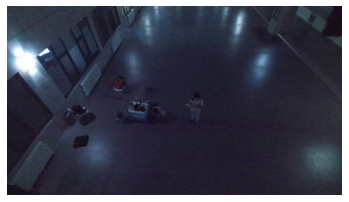

mAP: Undefined 843
------------------------------
Class name: A009
Image Name: P016S00G10B50H20UC062000LC082000A009R0_08261307_064.jpg


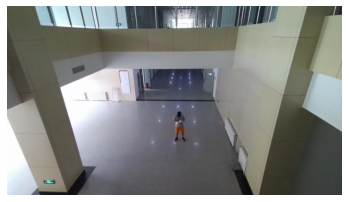

mAP: Undefined 844
------------------------------
Class name: A009
Image Name: P065S00G20B00H00UC022000LC091000A009R0_09111056_109.jpg
mAP: 0.058823529411764705 845
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P062S00G20B00H00UC102000LC021000A009R0_09100938_189.jpg
mAP: 0.6448426429395286 846
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P113S13G10B00H00UC051000LC051000A009R0_10021701_033.jpg
mAP: 0.3366946778711485 847
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P072S00G10B00H00UC072000LC022000A009R0_09142020_154.jpg


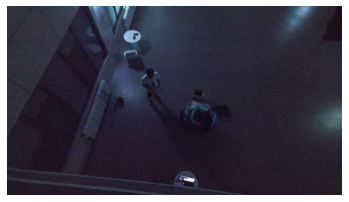

mAP: Undefined 848
------------------------------
Class name: A009
Image Name: P092S00G10B00H00UC072000LC061000A009R0_09210903_064.jpg
mAP: 0.8670930136760587 849
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P050S01G10B00H20UC072000LC072000A009R0_09041517_042.jpg
mAP: 0.9411764705882353 850
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P038S00G11B00H00UC072001LC061001A009R0_08310941_014.jpg
mAP: 0.9411764705882353 851
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P007S02G10B00H00UC022000LC022000A009R0_09011655_088.jpg
mAP: 0.9411764705882353 852
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P105S00G10B00H00UC032000LC022000A009R0_09261453_048.jpg
mAP: 0.8014129181084199 853
Number of true labels: 17
Number of pred labels: 17
-

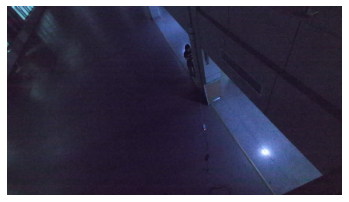

mAP: Undefined 862
------------------------------
Class name: A009
Image Name: P098S00G10B00H00UC051000LC021000A009R0_09231738_126.jpg
mAP: 0.9411764705882353 863
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P061S00G10B00H00UC092000LC021000A009R0_09091532_003.jpg
mAP: 0.22829131652661067 864
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P035S00G11B00H00UC072001LC022001A009R0_08301530_143.jpg
mAP: 0.7135785062688176 865
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P025S02G20B00H00UC043000LC043000A009R0_09011075_075.jpg
mAP: 0.5240641711229947 866
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P048S01G10B10H10UC072000LC022000A009R0_09041156_051.jpg
mAP: 0.8823529411764706 867
Number of true labels: 17
Number of pred labels: 17


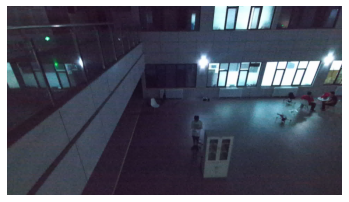

mAP: Undefined 876
------------------------------
Class name: A009
Image Name: P021S00G10B50H50UC032000LC051000A009R0_08261651_013.jpg
mAP: 0.9411764705882353 877
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P009S00G10B10H10UC032000LC032000A009R0_08251425_059.jpg
mAP: 0.9411764705882353 878
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P047S00G10B00H00UC072000LC021000A009R0_09030922_034.jpg
mAP: 0.9411764705882353 879
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P085S04G10B00H40UC072000LC021000A009R0_09181551_072.jpg
mAP: 0.9411764705882353 880
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P049S01G10B10H40UC062000LC022000A009R0_09041414_061.jpg
mAP: 0.9411764705882353 881
Number of true labels: 17
Number of pred labels: 17
-

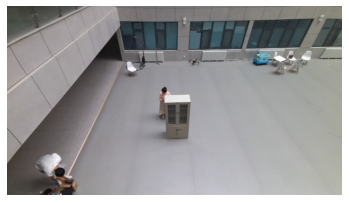

mAP: Undefined 916
------------------------------
Class name: A009
Image Name: P042S00G11B00H00UC072001LC022001A009R0_08311354_024.jpg
mAP: 0.9411764705882353 917
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P104S00G20B00H00UC011000LC031000A009R0_09252047_104.jpg


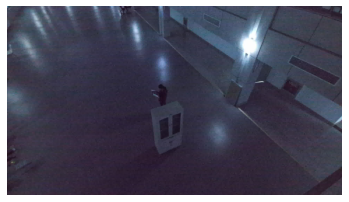

mAP: Undefined 918
------------------------------
Class name: A009
Image Name: P077S00G10B00H00UC042000LC032000A009R0_09161928_030.jpg
mAP: 0.9411764705882353 919
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P054S06G10B00H00UC052000LC021000A009R0_09071152_063.jpg
mAP: 0.9411764705882353 920
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P051S00G10B00H00UC042000LC061000A009R0_09031710_095.jpg
mAP: 0.9411764705882353 921
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P011S00G10B40H40UC022000LC022000A009R0_08251712_096.jpg
mAP: 0.9411764705882353 922
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P113S00G10B00H00UC021000LC021000A009R0_10020938_006.jpg
mAP: 0.003676470588235294 923
Number of true labels: 17
Number of pred labels: 17

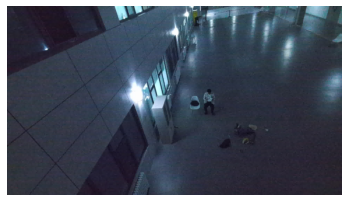

mAP: Undefined 933
------------------------------
Class name: A009
Image Name: P086S11G10B00H00UC071000LC031000A009R0_09251344_077.jpg
mAP: 0.9411764705882353 934
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P039S00G11B00H00UC022001LC022001A009R0_08311036_099.jpg
mAP: 0.9411764705882353 935
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P078S00G10B00H00UC072000LC031000A009R0_09171105_023.jpg
mAP: 0.8823529411764706 936
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P041S00G21B00H00UC053001LC053001A009R0_08311303_122.jpg
mAP: 0.9411764705882353 937
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P081S00G10B00H00UC072000LC021000A009R0_09180856_111.jpg
mAP: 0.010841983852364475 938
Number of true labels: 17
Number of pred labels: 17

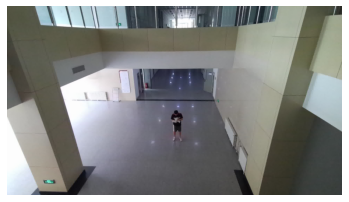

mAP: Undefined 945
------------------------------
Class name: A009
Image Name: P106S00G10B00H00UC021000LC021000A009R0_09261734_032.jpg
mAP: 0.8823529411764706 946
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P004S00G10B50H40UC092000LC022000A009R0_08251032_003.jpg
mAP: 0.9411764705882353 947
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P006S00G10B10H10UC072000LC022000A009R0_08251156_030.jpg
mAP: 0.9411764705882353 948
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P054S06G10B00H00UC052000LC062000A009R0_09061906_091.jpg
mAP: 0.7016806722689075 949
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P024S00G10B00H20UC062000LC062000A009R0_08271122_008.jpg
mAP: 0.9411764705882353 950
Number of true labels: 17
Number of pred labels: 17
-

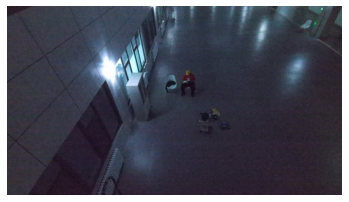

mAP: Undefined 956
------------------------------
Class name: A009
Image Name: P009S02G10B00H00UC011000LC032000A009R0_09271533_081.jpg
mAP: 0.15385565991102323 957
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P015S00G10B50H50UC022000LC022000A009R0_04161237_041.jpg
mAP: 0.8235294117647058 958
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P107S00G10B00H00UC021000LC031000A009R0_09262011_052.jpg
mAP: 0.1134453781512605 959
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P025S01G21B00H00UC082001LC031001A009R0_08291705_040.jpg
mAP: 0.9411764705882353 960
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A009
Image Name: P030S00G21B00H00UC033001LC033001A009R0_08291544_158.jpg
mAP: 0.9411764705882353 961
Number of true labels: 17
Number of pred labels: 17


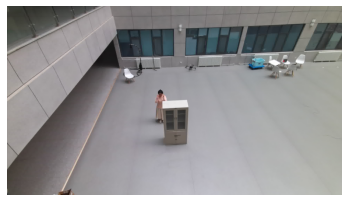

mAP: Undefined 996
------------------------------
Class name: A013
Image Name: P116S00G20B00H00UC111000LC021000A013R0_10010752_107.jpg
mAP: 0.9411764705882353 997
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P000S00G10B10H50UC022000LC021000A013R0_08251609_142.jpg
mAP: 0.9411764705882353 998
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P054S06G10B00H00UC052000LC021000A013R0_09071152_104.jpg
mAP: 0.9411764705882353 999
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P101S01G10B00H20UC072000LC021000A013R0_09242003_113.jpg
mAP: 0.7058823529411764 1000
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P006S09G10B00H20UC031000LC022000A013R0_09282100_089.jpg


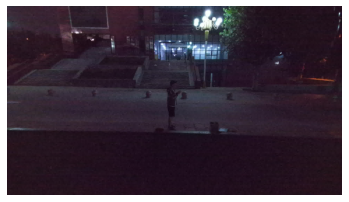

mAP: Undefined 1001
------------------------------
Class name: A013
Image Name: P041S00G21B00H00UC053001LC053001A013R0_08311303_031.jpg
mAP: 0.9411764705882353 1002
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P009S02G10B00H00UC011000LC032000A013R0_09271533_037.jpg
mAP: 0.15385565991102323 1003
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P071S00G10B00H00UC022000LC092000A013R0_09131939_058.jpg


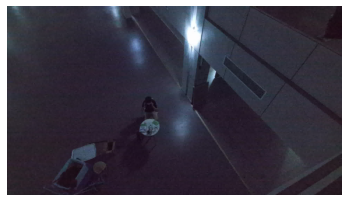

mAP: Undefined 1004
------------------------------
Class name: A013
Image Name: P029S00G21B00H00UC072001LC103001A013R0_08291427_129.jpg
mAP: 0.9411764705882353 1005
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P028S00G11B00H30UC032001LC031001A013R0_08291028_020.jpg
mAP: 0.9411764705882353 1006
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P056S00G10B00H00UC062000LC021000A013R0_09070932_106.jpg
mAP: 0.9411764705882353 1007
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P013S01G10B00H00UC022000LC031000A013R0_09051529_034.jpg
mAP: 0.9411764705882353 1008
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P117S00G10B00H00UC021000LC021000A013R0_10031037_018.jpg
mAP: 0.9411764705882353 1009
Number of true labels: 17
Number of pred labels

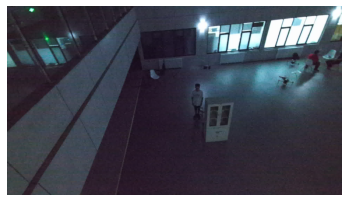

mAP: Undefined 1014
------------------------------
Class name: A013
Image Name: P037S00G11B00H00UC022001LC021001A013R0_08301729_090.jpg
mAP: 0.03691506014170374 1015
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P048S00G10B00H00UC072000LC022000A013R0_09031347_090.jpg
mAP: 0.8823529411764706 1016
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P019S00G10B30H20UC022000LC022000A013R0_08261355_097.jpg
mAP: 0.9411764705882353 1017
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P093S00G10B00H00UC081000LC111000A013R0_09211052_100.jpg


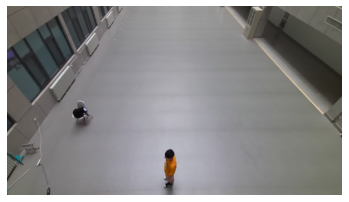

mAP: Undefined 1018
------------------------------
Class name: A013
Image Name: P107S00G10B00H00UC021000LC031000A013R0_09262011_012.jpg
mAP: 0.9411764705882353 1019
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P025S02G20B00H00UC043000LC043000A013R0_09011150_106.jpg


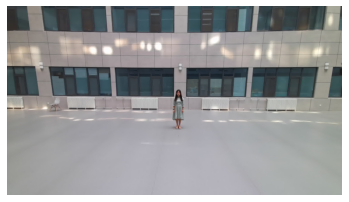

mAP: Undefined 1020
------------------------------
Class name: A013
Image Name: P068S00G10B00H00UC031000LC031000A013R0_09131501_018.jpg
mAP: 0.3883689839572192 1021
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P055S00G10B00H00UC072000LC021000A013R0_09061503_013.jpg
mAP: 0.8823529411764706 1022
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P065S00G20B00H00UC022000LC091000A013R0_09111056_052.jpg
mAP: 0.13935574229691877 1023
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P061S00G10B00H00UC092000LC021000A013R0_09091532_033.jpg
mAP: 0.4043849892898336 1024
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P043S00G11B00H00UC022001LC022001A013R0_08311554_006.jpg
mAP: 0.9411764705882353 1025
Number of true labels: 17
Number of pred label

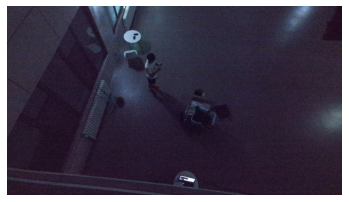

mAP: Undefined 1031
------------------------------
Class name: A013
Image Name: P064S00G10B00H00UC022000LC021000A013R0_09101557_052.jpg
mAP: 0.4520040369088812 1032
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P069S00G20B00H00UC053000LC053000A013R0_09131621_008.jpg
mAP: 0.5972893792097944 1033
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P057S00G10B00H00UC022000LC015500A013R0_09071704_155.jpg
mAP: 0.9411764705882353 1034
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P046S00G10B00H00UC072000LC022000A013R0_09011044_002.jpg
mAP: 0.9411764705882353 1035
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P113S00G10B00H00UC021000LC021000A013R0_10020938_034.jpg
mAP: 0.021935244686109738 1036
Number of true labels: 17
Number of pred labe

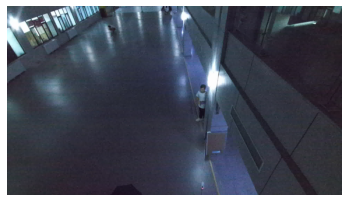

mAP: Undefined 1052
------------------------------
Class name: A013
Image Name: P033S00G11B00H00UC022001LC062001A013R0_08301405_026.jpg
mAP: 0.34558823529411764 1053
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P059S00G10B00H00UC072000LC021000A013R0_09091215_009.jpg
mAP: 0.022058823529411763 1054
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P090S03G10B00H30UC032000LC021000A013R0_09201601_026.jpg
mAP: 0.4966757291151755 1055
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P097S00G20B00H00UC072000LC031000A013R0_09222008_092.jpg


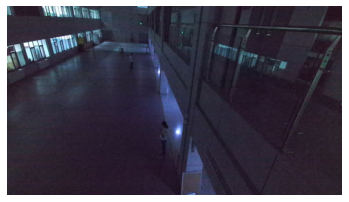

mAP: Undefined 1056
------------------------------
Class name: A013
Image Name: P055S06G10B00H00UC022000LC021000A013R0_09071549_049.jpg
mAP: 0.9411764705882353 1057
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P051S01G10B00H00UC072000LC021000A013R0_09041722_052.jpg
mAP: 0.9411764705882353 1058
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P005S00G10B50H20UC022000LC022000A013R0_08251156_136.jpg
mAP: 0.9411764705882353 1059
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P054S06G10B00H00UC052000LC062000A013R0_09061906_089.jpg
mAP: 0.702349563162712 1060
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P005S00G10B30H20UC022000LC022000A013R0_08260856_069.jpg
mAP: 0.9411764705882353 1061
Number of true labels: 17
Number of pred labels:

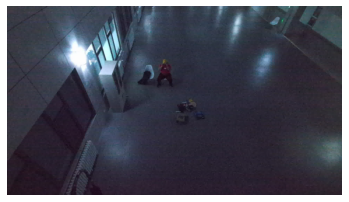

mAP: Undefined 1084
------------------------------
Class name: A013
Image Name: P096S00G20B00H00UC022000LC031000A013R0_09221854_009.jpg


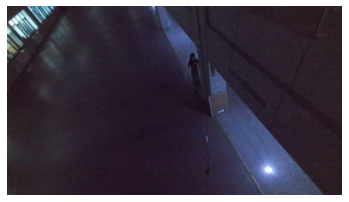

mAP: Undefined 1085
------------------------------
Class name: A013
Image Name: P074S14G10B00H00UC021000LC021000A013R0_09291917_059.jpg
mAP: 0.27442535837864557 1086
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P106S01G10B00H20UC021000LC021000A013R0_09261734_078.jpg
mAP: 0.2960883071177189 1087
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P038S00G11B00H00UC072001LC061001A013R0_08310941_021.jpg
mAP: 0.3028567309276652 1088
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P099S00G10B00H00UC031000LC031000A013R0_09231845_077.jpg
mAP: 0.9411764705882353 1089
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P054S00G10B00H00UC052000LC062000A013R0_09061153_113.jpg
mAP: 0.9411764705882353 1090
Number of true labels: 17
Number of pred label

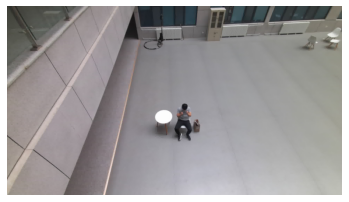

mAP: Undefined 1098
------------------------------
Class name: A013
Image Name: P032S00G11B00H00UC102001LC072001A013R0_08301030_039.jpg
mAP: 0.11764705882352942 1099
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P085S04G10B00H40UC072000LC021000A013R0_09181551_109.jpg
mAP: 0.9411764705882353 1100
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A013
Image Name: P074S00G10B00H00UC071000LC021000A013R0_09151812_063.jpg
mAP: 0.9411764705882353 1101
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P079S01G10B00H10UC022000LC021000A023R0_09171513_115.jpg
mAP: 0.8823529411764706 1102
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P019S00G10B30H20UC022000LC022000A023R0_08261355_006.jpg
mAP: 0.9411764705882353 1103
Number of true labels: 17
Number of pred label

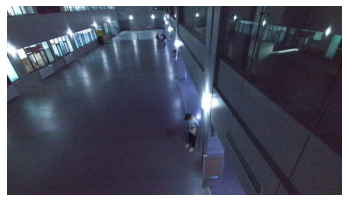

mAP: Undefined 1133
------------------------------
Class name: A023
Image Name: P065S01G20B00H20UC022000LC091000A023R0_09110536_053.jpg
mAP: 0.08088235294117647 1134
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P055S00G10B00H00UC072000LC021000A023R0_09061503_130.jpg
mAP: 0.8823529411764706 1135
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P110S01G10B00H20UC021000LC021000A023R0_10011320_087.jpg
mAP: 0.4520040369088812 1136
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P051S00G10B00H00UC072000LC062000A023R0_09040903_019.jpg
mAP: 0.3284313725490196 1137
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P060S00G10B00H00UC082000LC052000A023R0_09081816_084.jpg
mAP: 0.08835063437139562 1138
Number of true labels: 17
Number of pred labe

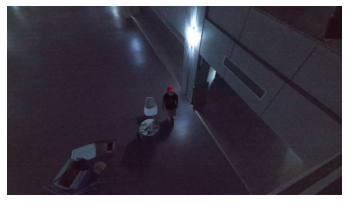

mAP: Undefined 1147
------------------------------
Class name: A023
Image Name: P001S02G20B00H20UC112000LC031000A023R0_09051220_142.jpg
mAP: 0.9411764705882353 1148
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P061S00G10B00H00UC092000LC021000A023R0_09091532_041.jpg
mAP: 0.7325061376531965 1149
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P040S00G11B00H00UC060501LC060501A023R0_08311121_050.jpg
mAP: 0.9411764705882353 1150
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P054S06G10B00H00UC052000LC062000A023R0_09061906_092.jpg
mAP: 0.702349563162712 1151
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P115S01G10B00H20UC061000LC021000A023R0_10021220_083.jpg
mAP: 0.3365340253748558 1152
Number of true labels: 17
Number of pred labels:

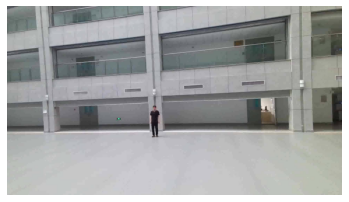

mAP: Undefined 1166
------------------------------
Class name: A023
Image Name: P041S01G20B00H00UC082000LC021000A023R0_09031803_112.jpg
mAP: 0.10099087763447626 1167
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P050S01G10B00H20UC072000LC072000A023R0_09041517_036.jpg
mAP: 0.9411764705882353 1168
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P008S00G20B50H40UC041000LC015500A023R0_08251156_155.jpg
mAP: 0.9411764705882353 1169
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P009S00G10B10H10UC032000LC032000A023R0_08251425_138.jpg
mAP: 0.9411764705882353 1170
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P010S00G10B40H30UC072000LC061000A023R0_08251425_019.jpg
mAP: 0.9411764705882353 1171
Number of true labels: 17
Number of pred label

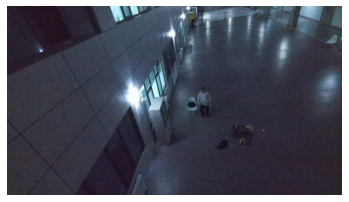

mAP: Undefined 1172
------------------------------
Class name: A023
Image Name: P091S01G10B00H20UC022000LC021000A023R0_09201811_126.jpg
mAP: 0.6953467620422638 1173
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P057S00G10B00H00UC022000LC030500A023R0_09071704_050.jpg
mAP: 0.30756302521008405 1174
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P089S03G10B00H30UC072000LC022000A023R0_09201413_047.jpg
mAP: 0.9411764705882353 1175
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P007S02G10B00H00UC022000LC022000A023R0_09011655_057.jpg
mAP: 0.9411764705882353 1176
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P047S01G10B00H00UC022000LC021000A023R0_09041056_039.jpg
mAP: 0.5917675893886967 1177
Number of true labels: 17
Number of pred label

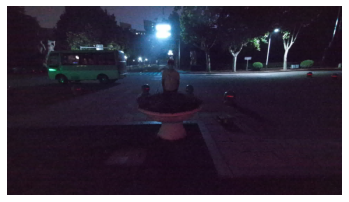

mAP: Undefined 1199
------------------------------
Class name: A023
Image Name: P025S00G20B00H00UC072000LC031000A023R0_08271446_023.jpg
mAP: 0.8025753418054455 1200
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P109S01G10B00H20UC072000LC022000A023R0_09271955_040.jpg


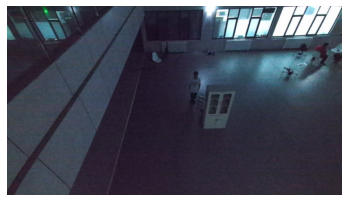

mAP: Undefined 1201
------------------------------
Class name: A023
Image Name: P076S01G10B00H20UC012000LC021000A023R0_09161703_064.jpg
mAP: 0.9411764705882353 1202
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P049S00G10B00H00UC062000LC022000A023R0_09031437_067.jpg
mAP: 0.8092560553633218 1203
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P008S01G21B00H00UC072001LC031001A023R0_08311459_007.jpg
mAP: 0.9411764705882353 1204
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P022S01G10B00H10UC072000LC021000A023R0_09071055_046.jpg
mAP: 0.9411764705882353 1205
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P077S01G10B00H10UC042000LC032000A023R0_09161928_021.jpg
mAP: 0.9411764705882353 1206
Number of true labels: 17
Number of pred labels

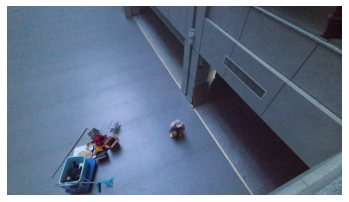

mAP: Undefined 1207
------------------------------
Class name: A023
Image Name: P098S01G10B00H20UC051000LC021000A023R0_09231738_046.jpg
mAP: 0.9411764705882353 1208
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P018S02G10B00H10UC012000LC022000A023R0_09111438_038.jpg
mAP: 0.6682858663827522 1209
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P029S01G20B00H00UC042000LC031000A023R0_09041619_096.jpg
mAP: 0.9411764705882353 1210
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P050S00G10B00H00UC072000LC042000A023R0_09031549_061.jpg
mAP: 0.9411764705882353 1211
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P103S01G10B00H20UC022000LC091000A023R0_09251727_068.jpg
mAP: 0.9411764705882353 1212
Number of true labels: 17
Number of pred labels

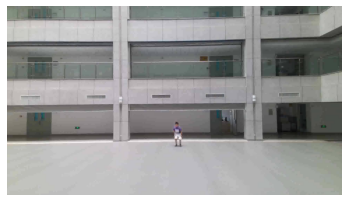

mAP: Undefined 1231
------------------------------
Class name: A023
Image Name: P059S00G10B00H00UC072000LC021000A023R0_09091215_081.jpg
mAP: 0.9411764705882353 1232
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P015S00G10B50H50UC022000LC022000A023R0_08261119_119.jpg
mAP: 0.9411764705882353 1233
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P024S00G10B00H20UC062000LC062000A023R0_08271122_075.jpg
mAP: 0.9411764705882353 1234
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P114S01G20B00H20UC011000LC021000A023R0_10021051_072.jpg
mAP: 0.163577195584116 1235
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A023
Image Name: P083S05G10B40H40UC012000LC021000A023R0_09181133_032.jpg
mAP: 0.8788927335640139 1236
Number of true labels: 17
Number of pred labels:

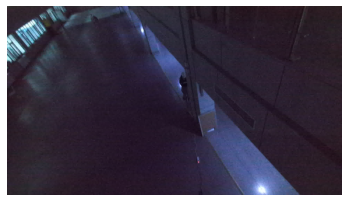

mAP: Undefined 1237
------------------------------
Class name: A023
Image Name: P013S01G10B00H00UC022000LC031000A023R0_09051529_084.jpg
mAP: 0.9411764705882353 1238
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P016S00G10B50H20UC062000LC082000A029R0_08261307_049.jpg


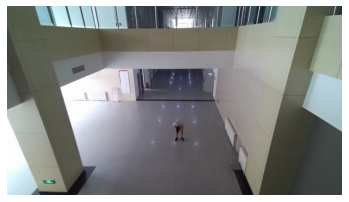

mAP: Undefined 1239
------------------------------
Class name: A029
Image Name: P061S01G10B00H20UC092000LC021000A029R0_09091532_017.jpg
mAP: 0.8823529411764706 1240
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P050S00G10B00H00UC072000LC042000A029R0_09031549_116.jpg
mAP: 0.3674163783160323 1241
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P014S00G10B40H20UC072000LC022000A029R0_08261035_082.jpg
mAP: 0.9411764705882353 1242
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P072S01G10B00H10UC072000LC022000A029R0_09142020_094.jpg


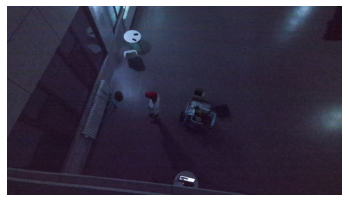

mAP: Undefined 1243
------------------------------
Class name: A029
Image Name: P003S00G10B50H30UC012000LC021000A029R0_08251032_086.jpg
mAP: 0.9411764705882353 1244
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P035S00G11B00H00UC072001LC022001A029R0_08301530_048.jpg
mAP: 0.9411764705882353 1245
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P050S01G10B00H20UC072000LC072000A029R0_09041517_008.jpg
mAP: 0.9411764705882353 1246
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P000S03G10B00H20UC021000LC021000A029R0_09301543_050.jpg
mAP: 0.17338111715274346 1247
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P101S02G10B00H10UC072000LC021000A029R0_09242003_061.jpg
mAP: 0.18498886734180847 1248
Number of true labels: 17
Number of pred labe

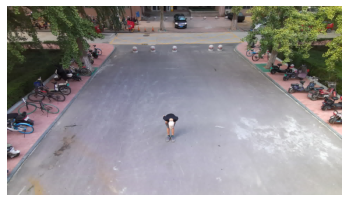

mAP: Undefined 1249
------------------------------
Class name: A029
Image Name: P110S02G10B00H10UC021000LC021000A029R0_10011320_070.jpg
mAP: 0.9411764705882353 1250
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P032S00G11B00H00UC102001LC072001A029R0_08301030_037.jpg


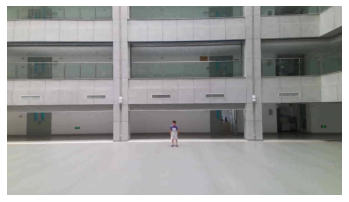

mAP: Undefined 1251
------------------------------
Class name: A029
Image Name: P078S12G10B00H20UC012000LC022000A029R0_09191137_103.jpg
mAP: 0.08442906574394464 1252
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P113S14G10B00H20UC051000LC051000A029R0_10021701_114.jpg
mAP: 0.1837709147830255 1253
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P023S00G10B00H20UC022000LC021000A029R0_08270936_016.jpg
mAP: 0.11645452298566486 1254
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P054S00G10B00H00UC052000LC062000A029R0_09061153_097.jpg
mAP: 0.5858852364475202 1255
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P067S01G10B00H40UC072000LC022000A029R0_09112012_037.jpg


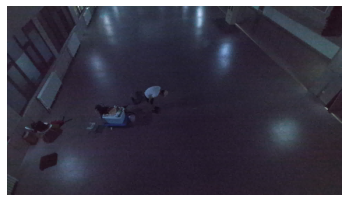

mAP: Undefined 1256
------------------------------
Class name: A029
Image Name: P100S02G10B00H10UC072000LC031000A029R0_09241642_111.jpg
mAP: 0.8788927335640139 1257
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P045S00G10B00H00UC072000LC022000A029R0_09010835_005.jpg
mAP: 0.6173414820473644 1258
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P114S01G20B00H20UC011000LC021000A029R0_10021051_072.jpg
mAP: 0.2577586917119789 1259
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P103S01G10B00H20UC022000LC091000A029R0_09251727_062.jpg
mAP: 0.9411764705882353 1260
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P066S01G20B00H10UC112000LC031000A029R0_09111909_147.jpg


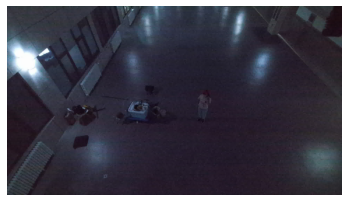

mAP: Undefined 1261
------------------------------
Class name: A029
Image Name: P023S01G11B30H00UC062001LC091001A029R0_08300901_040.jpg
mAP: 0.5557422969187675 1262
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P069S01G20B00H10UC053000LC053000A029R0_09131621_047.jpg
mAP: 0.8576661660139169 1263
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P115S02G10B00H10UC061000LC021000A029R0_10021220_014.jpg
mAP: 0.33170209260174655 1264
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P074S02G10B00H10UC071000LC021000A029R0_09151812_034.jpg
mAP: 0.9411764705882353 1265
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P027S00G10B00H00UC022000LC092000A029R0_09031030_037.jpg
mAP: 0.9411764705882353 1266
Number of true labels: 17
Number of pred label

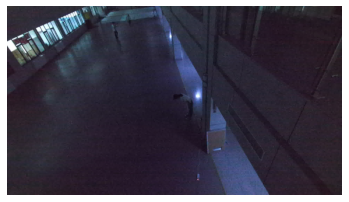

mAP: Undefined 1274
------------------------------
Class name: A029
Image Name: P040S00G11B00H00UC061001LC061001A029R0_08311121_058.jpg
mAP: 0.9411764705882353 1275
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P001S00G20B40H20UC072000LC021000A029R0_08241838_056.jpg
mAP: 0.4060924369747899 1276
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P011S00G10B40H40UC022000LC022000A029R0_08251712_119.jpg
mAP: 0.9411764705882353 1277
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P000S01G10B10H50UC022000LC021000A029R0_08251609_022.jpg
mAP: 0.2908963585434174 1278
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P009S02G10B00H00UC042000LC062000A029R0_09011558_050.jpg


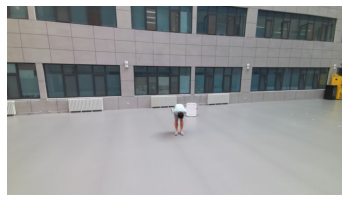

mAP: Undefined 1279
------------------------------
Class name: A029
Image Name: P060S07G10B00H10UC011000LC031000A029R0_09231239_017.jpg


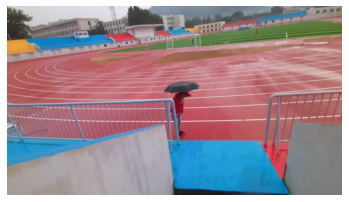

mAP: Undefined 1280
------------------------------
Class name: A029
Image Name: P006S00G10B10H10UC072000LC022000A029R0_08251156_044.jpg
mAP: 0.9411764705882353 1281
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P028S00G11B00H30UC032001LC031001A029R0_08291028_071.jpg
mAP: 0.9411764705882353 1282
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P011S00G10B40H40UC022000LC022000A029R1_08251712_009.jpg
mAP: 0.9411764705882353 1283
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P074S15G10B00H20UC021000LC021000A029R0_09291917_073.jpg
mAP: 0.7135785062688176 1284
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P042S01G10B00H00UC022000LC021000A029R0_09031205_006.jpg
mAP: 0.9411764705882353 1285
Number of true labels: 17
Number of pred labels

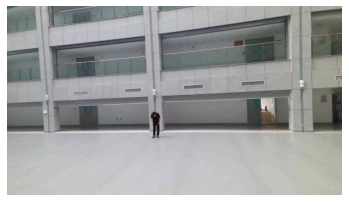

mAP: Undefined 1296
------------------------------
Class name: A029
Image Name: P017S00G10B10H50UC022000LC062000A029R0_08261355_132.jpg
mAP: 0.9411764705882353 1297
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P058S00G10B00H00UC022000LC071000A029R0_09071953_113.jpg
mAP: 0.0 1298
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P030S01G20B00H00UC072000LC033000A029R0_09061612_070.jpg
mAP: 0.9411764705882353 1299
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P049S00G10B00H00UC062000LC022000A029R0_09031437_084.jpg
mAP: 0.8823529411764706 1300
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P022S01G10B00H10UC072000LC021000A029R0_09071055_029.jpg
mAP: 0.04299719887955182 1301
Number of true labels: 17
Number of pred labels: 17
---------

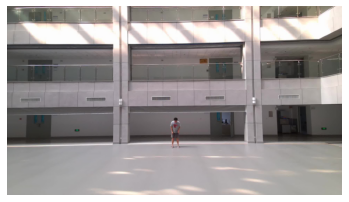

mAP: Undefined 1317
------------------------------
Class name: A029
Image Name: P020S00G20B50H40UC022000LC041000A029R0_08261615_019.jpg
mAP: 0.8576661660139169 1318
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P052S01G10B00H00UC022000LC022000A029R0_09060916_057.jpg
mAP: 0.8576661660139169 1319
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P041S01G20B00H00UC082000LC021000A029R0_09031803_103.jpg
mAP: 0.25951557093425603 1320
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P013S00G10B50H40UC032000LC021000A029R0_08260955_009.jpg
mAP: 0.9411764705882353 1321
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P031S02G20B00H20UC022000LC022000A029R0_09111750_051.jpg


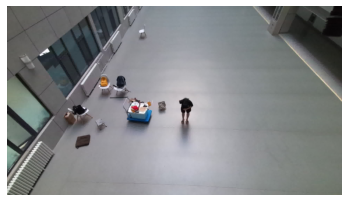

mAP: Undefined 1322
------------------------------
Class name: A029
Image Name: P098S01G10B00H20UC051000LC021000A029R0_09231738_099.jpg
mAP: 0.5454152249134948 1323
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P048S00G10B00H00UC072000LC022000A029R0_09031347_023.jpg
mAP: 0.9411764705882353 1324
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P114S18G20B40H30UC061000LC021000A029R0_10031615_013.jpg
Error: 'x'
------------------------------
Class name: A029
Image Name: P013S01G10B00H00UC022000LC031000A029R0_09051529_076.jpg
mAP: 0.9411764705882353 1325
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P112S03G10B00H30UC051000LC061000A029R0_10011635_068.jpg
mAP: 0.13140550337782173 1326
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P083

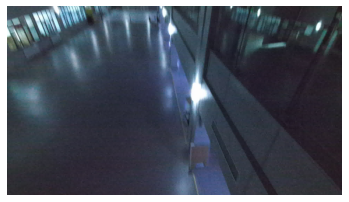

mAP: Undefined 1353
------------------------------
Class name: A029
Image Name: P089S04G10B00H40UC072000LC022000A029R0_09201413_056.jpg
mAP: 0.9411764705882353 1354
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P018S02G10B00H10UC012000LC022000A029R0_09111438_054.jpg
mAP: 0.9411764705882353 1355
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P003S03G10B00H30UC012000LC021000A029R0_09292027_099.jpg
mAP: 0.8712946943483276 1356
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P008S00G20B50H40UC041000LC031000A029R0_08251156_088.jpg
mAP: 0.9411764705882353 1357
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P007S00G10B40H50UC022000LC052000A029R0_08251156_125.jpg
mAP: 0.9411764705882353 1358
Number of true labels: 17
Number of pred labels

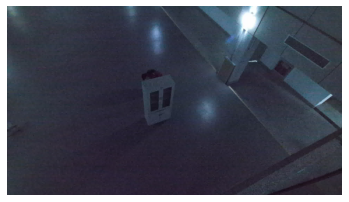

mAP: Undefined 1362
------------------------------
Class name: A029
Image Name: P077S02G10B00H20UC042000LC032000A029R0_09161928_128.jpg
mAP: 0.8325473306009639 1363
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P023S00G10B00H20UC022000LC021000A029R0_08270936_029.jpg
mAP: 0.9411764705882353 1364
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P030S00G21B00H00UC033001LC033001A029R0_08291544_002.jpg
mAP: 0.9411764705882353 1365
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P025S00G20B00H00UC072000LC031000A029R0_08271446_022.jpg


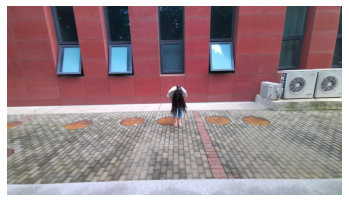

mAP: Undefined 1366
------------------------------
Class name: A029
Image Name: P093S01G10B00H20UC082000LC112000A029R0_09211052_140.jpg


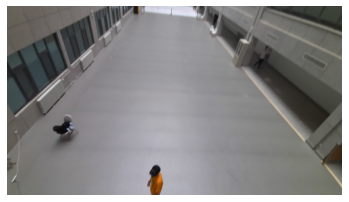

mAP: Undefined 1367
------------------------------
Class name: A029
Image Name: P087S01G10B00H20UC072000LC021000A029R0_09201030_131.jpg
mAP: 0.9411764705882353 1368
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P001S02G20B00H20UC112000LC031000A029R0_09051220_112.jpg
mAP: 0.9411764705882353 1369
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P054S06G10B00H00UC052000LC062000A029R0_09061906_114.jpg


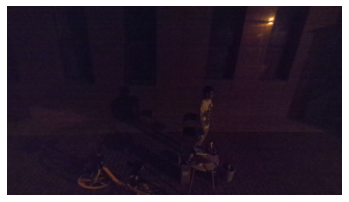

mAP: Undefined 1370
------------------------------
Class name: A029
Image Name: P086S01G10B00H20UC072000LC021000A029R0_09191527_123.jpg
mAP: 0.9411764705882353 1371
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P067S01G10B00H10UC072000LC022000A029R0_09112106_074.jpg
mAP: 0.9411764705882353 1372
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P009S03G10B00H20UC011000LC032000A029R0_09271533_122.jpg
mAP: 0.9411764705882353 1373
Number of true labels: 17
Number of pred labels: 17
------------------------------
Class name: A029
Image Name: P117S03G10B00H30UC021000LC021000A029R0_10031037_043.jpg
mAP: 0.9411764705882353 1374
Number of true labels: 17
Number of pred labels: 17
------------------------------


In [17]:
# List to store image names
img_names = []

# List to store the class of the files
class_names = []

# List to store the mAP values
mAP_list = []

# Individual list to store the predicted values of X and Y 
# coordinates of the body parts
pred_x = []
pred_y = []

# Individual list to store the ground truth values of X and Y 
# coordinates of the body parts
true_x = []
true_y = []

# Class path
folder_path = "..\\classes\\"

# Count of number of files
cnt = 0
        
# Iterate over the files and generate keypoints
for filepath in train_files:
    # Extract class and image name
    class_name = filepath.rsplit("\\")[-2]
    img_name = filepath.rsplit("\\")[-1]
    print("Class name:", class_name)
    print("Image Name:", img_name)
    
    # List to capture parts that don't exist in groudn truth
    zero_ind = []

    # Get JSON and image path
    label_path = folder_path+filepath.rsplit("\\")[-2]+"\\"+filepath.rsplit('\\')[-1].rsplit('.')[0]+".json"
    img_path = folder_path+filepath.rsplit("\\")[-2]+"\\"+img_name

    try:
        # Get keypoints coordinates for each body part
        true_labels = read_json(label_path)
        
        # If the part doesn't exist in groudn truth, get its index
        for key in true_labels.keys():
            if true_labels[key] == [0.0, 0.0]:
                zero_ind.append(index_body_part[key])

        # List to identify the body parts labeled within the image
        true_label_present_list = [index_body_part[i] for i in list(true_labels.keys())]
        
        # Run OpenPose and get keypoints
        pred_labels, subset = predict_n_draw(img_path, true_label_present_list, zero_ind)

        # If model output is empty
        if pred_labels is None and subset is None:
            print("mAP: Undefined", cnt)
            cnt += 1
            img_names.append(img_name)
            class_names.append(class_name)
            mAP_list.append(0.0)
        else:
            # If the body part in ground truth has coordinate [0.0, 0.0], then make
            # predicted label 0 as well
            for key in true_labels.keys():
                if key not in pred_labels.keys():
                    pred_labels[key] = [0.0, 0.0]

            # Calculate mAP
            output = mAP(true_labels, pred_labels)
            # Append it to mAP list to keep count
            mAP_list.append(output)
            print("mAP:", output, cnt)
        
            cnt += 1
            img_names.append(img_name)
            class_names.append(class_name)
            # Get coordinates for MLP
            # Predicted coordinates
            pred_x.append([i[0] for i in list(pred_labels.values())])
            pred_y.append([i[1] for i in list(pred_labels.values())])
            # True coordinates
            true_x.append([i[0] for i in list(true_labels.values())])
            true_y.append([i[1] for i in list(true_labels.values())])
            print("Number of true labels:", len(true_labels))
            print("Number of pred labels:", len(pred_labels))
        print("-"*30)
    except Exception as e:
        # As a safety measure 
        print("Error:", e)
        img_names.append(img_name)
        class_names.append(class_name)
        mAP_list.append(-1)
        print("-"*30)

# Store Results

In [22]:
# Store class name, image name and corresponding mAP values and store it in a datset
results_df = pd.DataFrame({'class_name': class_names, 'image_name':img_names, 'mAP': mAP_list})
results_df.to_csv("openpose_baseline_results_train.csv", index=False)

In [24]:
# Store the true and predicted coordinates of body keypoints
coords_df = pd.DataFrame({'true_x': true_x, 'true_y':true_y, 
                          'pred_x': pred_x, 'pred_y':pred_y})
coords_df.to_csv("train_coords.csv", index=False)